In [1]:
import numpy as np
import xarray as xr
from datetime import datetime
import cftime
import matplotlib.pyplot as plt
from climatetranslation.unit.data import (
    get_dataset, 
    dataset_time_overlap, 
    any_calendar_to_datetime,
    construct_regridders,
    even_lat_lon,
    get_land_mask,
    precip_kilograms_to_mm
)

from climatetranslation.unit.translate import (
    network_translate_constructor,
    get_data_transformer
)
from climatetranslation.unit.utils import get_config

from dask.diagnostics import ProgressBar
import cartopy.crs as ccrs
import torch
import cmocean
import matplotlib.colors as colors
from skimage.metrics import structural_similarity as ssim

projection = ccrs.PlateCarree()

In [2]:
train_current = torch.load("/home/dfulu/model_outputs/outputs/v8.5_monsoon_hadgem_to_era5/images/gen_a2b_train_current.pt", map_location='cpu')

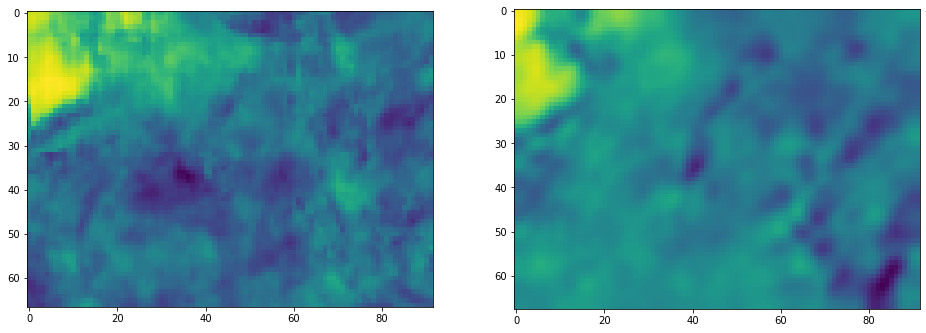

In [3]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,8))
c = 0
sl = slice(None, None)
ax1.imshow(train_current[:len(train_current)//2].mean(axis=0)[c,sl,sl][:-1].numpy()[::-1])
ax2.imshow(train_current[len(train_current)//2:].mean(axis=0)[c,sl,sl].numpy()[::-1])

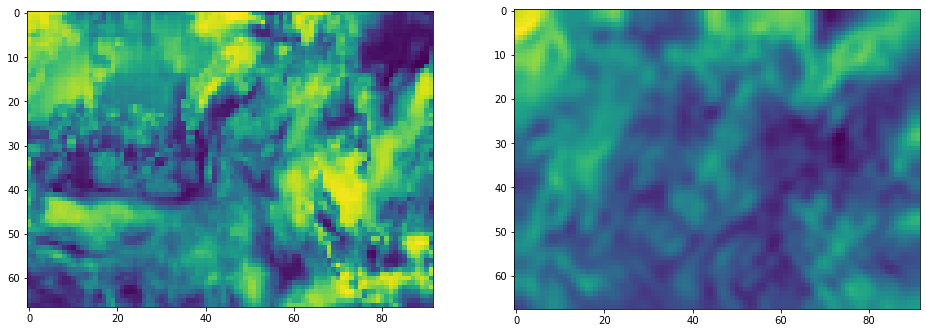

In [4]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,8))
n = 7
c = 0
sl = slice(None, None)
ax1.imshow(train_current[n][c,sl,sl][:-1].numpy()[::-1])
ax2.imshow(train_current[len(train_current)//2+n][c,sl,sl].numpy()[::-1])

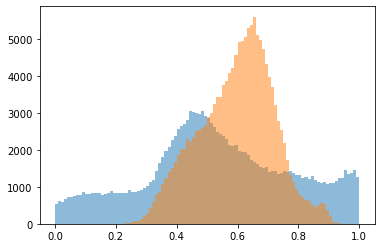

In [5]:
c = 0 # channel number
t = train_current[:,c].numpy()
r = (t.min(), t.max())
bins=100
plt.hist(t[:len(train_current)//2].flatten(), range=r, bins=bins, alpha=0.5)
plt.hist(t[len(train_current)//2:].flatten(), range=r, bins= bins, alpha=0.5)
plt.show()

In [2]:
conf = get_config("/home/dfulu/model_outputs/outputs/v8.5_monsoon_hadgem_to_era5/config.yaml")

In [3]:
get_config("/home/dfulu/model_outputs/outputs/v8.2_monsoon_hadgem_to_era5/config.yaml")

{'image_save_iter': 10000,
 'image_display_iter': 100,
 'display_size': 16,
 'snapshot_save_iter': 2000,
 'log_iter': 10,
 'max_iter': 1000000,
 'batch_size': 8,
 'weight_decay': 0.0001,
 'beta1': 0.5,
 'beta2': 0.999,
 'init': 'kaiming',
 'lr': 0.0005,
 'lr_policy': 'step',
 'step_size': 100000,
 'gamma': 0.5,
 'gan_w': 1,
 'recon_x_w': 10,
 'recon_x_multi': [5, 1, 1, 1, 1],
 'recon_h_w': 0,
 'recon_kl_w': 0.005,
 'recon_x_cyc_w': 10,
 'recon_kl_cyc_w': 0.005,
 'recon_loss_func': 'mae',
 'gen': {'dim': 128,
  'norm': 'bn',
  'activ': 'lrelu',
  'n_downsample': 2,
  'n_res': 1,
  'pad_type': 'replicate',
  'upsample': 'nearest',
  'output_activ': ['relu', 'none', '-relu', 'relu', 'none']},
 'dis': {'dim': 128,
  'norm': 'bn',
  'activ': 'lrelu',
  'n_layer': 4,
  'gan_type': 'lsgan',
  'num_scales': 3,
  'pad_type': 'replicate'},
 'num_workers': 5,
 'data_zarr_a': '/datadrive/era5/all_hist_global_zarr',
 'data_zarr_b': '/datadrive/hadgem3/all_hist_zarr',
 'agg_data_a': '/datadrive/era5

In [4]:
conf['level_vars']

{0: ['pr'], 2: ['tas', 'tasmin', 'tasmax'], 5500: ['z500']}

In [5]:
conf

{'image_save_iter': 10000,
 'image_display_iter': 100,
 'display_size': 16,
 'snapshot_save_iter': 2000,
 'log_iter': 10,
 'max_iter': 1000000,
 'batch_size': 16,
 'weight_decay': 0.0001,
 'beta1': 0.5,
 'beta2': 0.999,
 'init': 'kaiming',
 'lr': 0.0005,
 'lr_policy': 'step',
 'step_size': 100000,
 'gamma': 0.5,
 'gan_w': 1,
 'recon_x_w': 10,
 'recon_x_multi': [1, 1, 1, 1, 1],
 'recon_h_w': 0,
 'recon_kl_w': 0.005,
 'recon_x_cyc_w': 10,
 'recon_kl_cyc_w': 0.005,
 'recon_loss_func': ['mae', 'mae', 'mae', 'mae', 'mae'],
 'gen': {'dim': 128,
  'norm': 'bn',
  'activ': 'lrelu',
  'n_downsample': 2,
  'n_res': 1,
  'pad_type': 'replicate',
  'upsample': 'nearest',
  'output_activ': ['relu', 'relu', 'relu', 'relu', 'none']},
 'dis': {'dim': 128,
  'norm': 'bn',
  'activ': 'lrelu',
  'n_layer': 4,
  'gan_type': 'lsgan',
  'num_scales': 3,
  'pad_type': 'replicate'},
 'num_workers': 5,
 'data_zarr_a': '/datadrive/era5/all_hist_quantile_monsoon_zarr',
 'data_zarr_b': '/datadrive/hadgem3/all_his

In [4]:
def select_months(da, months, drop=False):
    in_months = xr.DataArray(np.isin(da['time.month'], months), coords=[da.time])
    return da.where(in_months, drop=drop)

def common_min_max(das):
    vmin = min([da.min() for da in das])
    vmax = max([da.max() for da in das])
    return vmin, vmax

In [5]:
conf_levels = conf['level_vars']
bbox = conf['bbox']

In [6]:
model = 'era5'
other_model = ({'era5','hadgem3'} - {model}).pop()

In [38]:
ls /datadrive/era5/

all_hist_global_qm_to_had_zarr/  download.sh
all_hist_global_zarr/            global_all_hist_hadgem3_v1_agg.nc
all_hist_hadgem3_v1_agg.nc       monsoon_all_hist_hadgem3_agg.nc
all_hist_quantile_monsoon_zarr/  monsoon_to_hadgem3_zarr/
all_hist_to_hadgem3_zarr/        tmp/
all_hist_zarr/                   to_hadgem3/
dl.log                           v8_monsoon_to_hadgem/
dlg.log


In [7]:
ds_target = get_dataset(
                        #f"/datadrive/era5/all_hist_quantile_monsoon_zarr", 
                        f"/datadrive/era5/all_hist_global_zarr", 
                      conf_levels, 
                      filter_bounds=False,
                      split_at=360, 
                      bbox=bbox)
ds_base = get_dataset(#f"/datadrive/hadgem3/all_hist_quantile_monsoon_zarr", 
                      f"/datadrive/hadgem3/all_hist_zarr", 
                      conf_levels, 
                      filter_bounds=False,
                      split_at=360, 
                      bbox=bbox)
ds_trans = get_dataset(f"/datadrive/hadgem3/v8.2_monsoon_unit40k_and_qm_to_era5",
                       #f"/datadrive/hadgem3/v8.5_monsoon_to_era5_90k_values",
                       conf_levels, 
                       filter_bounds=False, 
                       split_at=360, 
                       bbox=bbox)

ds_qm = get_dataset(#f"/datadrive/hadgem3/all_hist_quantile_monsoon_zarr",
                    f"/datadrive/hadgem3/all_hist_qm_to_era_zarr",
                       conf_levels, 
                       filter_bounds=False, 
                       split_at=360, 
                       bbox=bbox)


rg_t, rg_b = construct_regridders(
    ds_target, 
    ds_base, 
    resolution_match='downscale', 
    scale_method='conservative', 
    periodic=False)

if rg_t is not None:
    ds_target = rg_t(ds_target)
if rg_b is not None:
    ds_base = rg_b(ds_base)
    
if conf['time_range'] is not None:
    if conf['time_range'] == 'overlap':
        ds_target, ds_base, ds_trans, ds_qm = dataset_time_overlap([ds_target, ds_base, ds_trans, ds_qm])
    elif isinstance(conf['time_range'], dict):
        time_slice = slice(conf['time_range']['start_date'], conf['time_range']['end_date'])
        ds_target, ds_base, ds_trans, ds_qm, ds_qm_reverse = [ds.sel(time=time_slice) for ds in [ds_target, ds_base, ds_trans, ds_qm]]
    else:
        raise ValueError("time_range not valid : {}".format(conf['time_range']))

{'N': 30, 'S': -8, 'E': 121, 'W': 44}
{'N': 30, 'S': -8, 'E': 121, 'W': 44}
{'N': 30, 'S': -8, 'E': 121, 'W': 44}
{'N': 30, 'S': -8, 'E': 121, 'W': 44}
Create weight file: conservative_76x154_68x92.nc
Remove file conservative_76x154_68x92.nc
using dimensions ('lat', 'lon') from data variable pr as the horizontal dimensions for this dataset.
start time (1979-01-01T12:00:00) and end time (2013-12-30T12:00:00)


In [8]:
for ds in [ds_target, ds_base, ds_trans, ds_qm]:
    precip_kilograms_to_mm(ds)

In [9]:
#from skimage.metrics import structural_similarity as ssim

def calc_range(das):
    vmin, vmax = common_min_max(das)
    return (vmax - vmin).values

def find_closest(da_ref, da_search, use_ssim=True):
    if use_ssim:
        r = calc_range([da_search, da_ref])
        s = ssim(
            np.tile(da_ref.values,(len(da_search.time),1,1)), 
            da_search.values, 
            data_range=r, 
            full=True
        )[1].mean(axis=(-1,-2))
        n = s.argmax()
    else:
        s  = ((np.tile(da_ref.values,(len(da_search.time),1,1)) - da_search.values)**2).mean(axis=(-1,-2))
        n = s.argmin()
    return n, da_search.isel(time=n)

find_closest(ds_base.pr.isel(time=slice(233,234), run=0), ds_base.pr.isel(run=0, time=slice(0, 1000)), use_ssim=0)

(233, <xarray.DataArray 'pr' (lat: 68, lon: 92)>
 dask.array<getitem, shape=(68, 92), dtype=float32, chunksize=(68, 92), chunktype=numpy.ndarray>
 Coordinates:
   * lat      (lat) float32 -7.499997 -6.9444413 ... 29.166672 29.722227
   * lon      (lon) float32 44.583332 45.416664 46.25 ... 119.58333 120.416664
     run      int64 1
     time     object 1979-08-24 12:00:00)

In [10]:
%%time
ds_target.load()
ds_base.load()
ds_trans.load()
ds_qm = ds_qm.load()

CPU times: user 4min 8s, sys: 1min 17s, total: 5min 25s
Wall time: 3min 19s


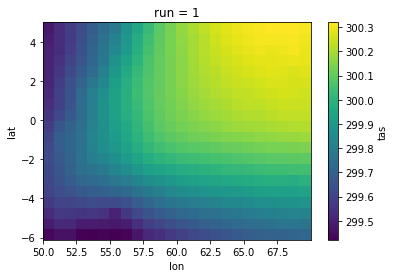

In [13]:
ds_target.tas.sel(lat=slice(-6, 5), lon=slice(50, 70)).mean(dim='time').isel(run=0).plot()

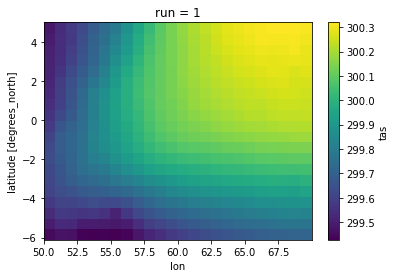

In [14]:
ds_trans.tas.sel(lat=slice(-6, 5), lon=slice(50, 70)).mean(dim='time').isel(run=0).plot()

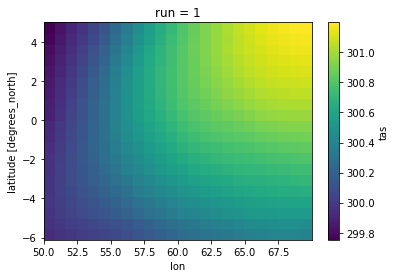

In [15]:
ds_base.tas.sel(lat=slice(-6, 5), lon=slice(50, 70)).mean(dim='time').isel(run=0).plot()

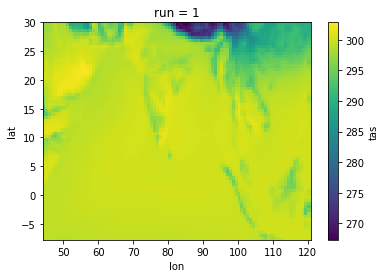

In [16]:
ds_target.tas.mean(dim='time').isel(run=0).plot()

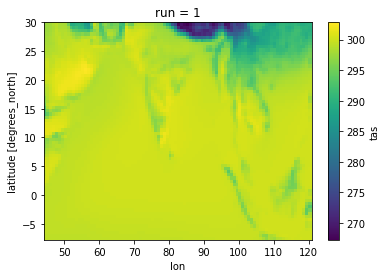

In [17]:
ds_trans.tas.mean(dim='time').isel(run=0).plot()

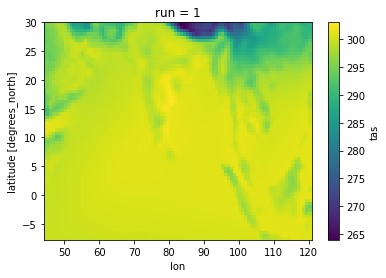

In [18]:
ds_base.tas.mean(dim='time').isel(run=0).plot()

In [19]:
ds_base.lon.shape

(92,)

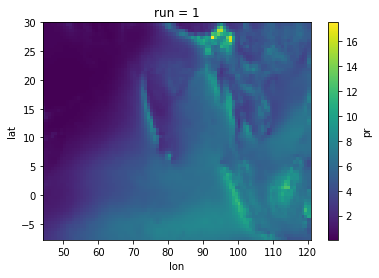

In [20]:
ds_target.pr.mean(dim='time').isel(run=0).plot()

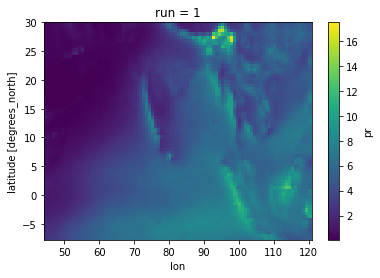

In [21]:
ds_trans.pr.mean(dim='time').isel(run=0).plot()

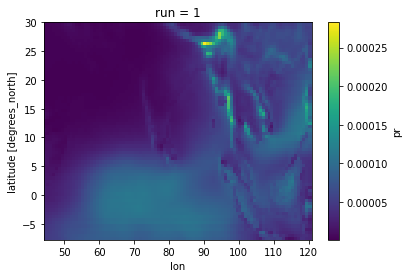

In [57]:
ds_base.pr.mean(dim='time').isel(run=0).plot()

In [22]:
def range_multi(L):
    vmin = min([l.min() for l in L]).values
    vmax = max([l.max() for l in L]).values
    return vmin, vmax

In [23]:
x_trans.max()

NameError: name 'x_trans' is not defined

In [ ]:
def transform(x):
    #x = x.where(get_land_mask(x)[0])
    #x = x.tas#.clip(270, 320)
    x = x.tas.sel(lat=20, lon=50, method='nearest')#.clip(1e-2, None)
    return x

bins=300

plt.figure()

x_trans = transform(ds_trans)
x_target = transform(ds_target)
x_base = transform(ds_base)
x_qm = transform(ds_qm)


def plot_hist(x, histtype , label, **kwargs):
    #x.plot.hist(bins=np.concatenate([[0],np.logspace(start=np.log10(0.1), stop=np.log10(vmax), num=bins-1)]), 
    #           histtype=histtype, label=label, density=False)
    x.plot.hist(bins=40, 
               histtype=histtype, label=label, density=True, **kwargs)

plot_hist(x_base, histtype='step', label='HadGEM3')
plot_hist(x_qm, histtype='step', label='QM')
plot_hist(x_trans, histtype='step', label='UNIT')
plot_hist(x_target, histtype='stepfilled', label='ERA5', alpha=0.5)



plt.legend()

#plt.ylim(0, 50)
plt.show()

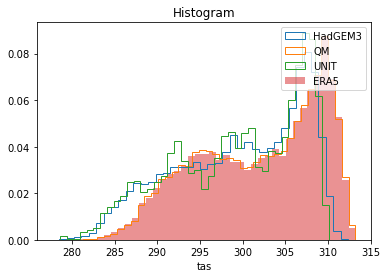

In [60]:
def transform(x):
    #x = x.where(get_land_mask(x)[0])
    #x = x.tas#.clip(270, 320)
    x = x.tas.sel(lat=20, lon=50, method='nearest')#.clip(1e-2, None)
    return x

bins=300

plt.figure()

x_trans = transform(ds_trans)
x_target = transform(ds_target)
x_base = transform(ds_base)
x_qm = transform(ds_qm)


def plot_hist(x, histtype , label, **kwargs):
    #x.plot.hist(bins=np.concatenate([[0],np.logspace(start=np.log10(0.1), stop=np.log10(vmax), num=bins-1)]), 
    #           histtype=histtype, label=label, density=False)
    x.plot.hist(bins=40, 
               histtype=histtype, label=label, density=True, **kwargs)

plot_hist(x_base, histtype='step', label='HadGEM3')
plot_hist(x_qm, histtype='step', label='QM')
plot_hist(x_trans, histtype='step', label='UNIT')
plot_hist(x_target, histtype='stepfilled', label='ERA5', alpha=0.5)



plt.legend()

#plt.ylim(0, 50)
plt.show()

In [48]:
ds_base.time.min()

<xarray.DataArray 'time' ()>
array(cftime.Datetime360Day(1979, 1, 1, 12, 0, 0, 0), dtype=object)

In [49]:
ds_base.time.max()

<xarray.DataArray 'time' ()>
array(cftime.Datetime360Day(2013, 12, 30, 12, 0, 0, 0), dtype=object)

In [46]:
def transform(x):
    #x = x.where(get_land_mask(x)[0])
    #x = x.tas#.clip(270, 320)
    x = x.isel(run=0).sel(lon=90, lat=28, method='nearest')
    x = x.pr
    return x

bins=300

x_trans = transform(ds_trans)
x_target = transform(ds_target)
x_base = transform(ds_base)
x_qm = transform(ds_qm)

vmin, vmax = range_multi([x_trans, x_target, x_base, x_qm])

x_trans = np.histogram(x_trans, bins=bins, density=True, range=(vmin, vmax))
x_target = np.histogram(x_target, bins=bins, density=True, range=(vmin, vmax));
x_base = np.histogram(x_base, bins=bins, density=True, range=(vmin, vmax));
x_qm = np.histogram(x_qm, bins=bins, density=True, range=(vmin, vmax));

2.5915957760124835 0.01981595548573981
3.617142472261745 0.46376175433664363
3.0118287726608295 0.17079327759295282
3.607261772806831 0.4392068989978229


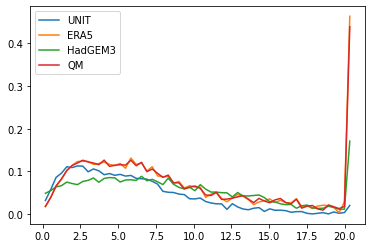

In [47]:
xmax = 20
for x, title in zip([x_trans, x_target, x_base, x_qm], ['UNIT', 'ERA5', 'HadGEM3', 'QM']):
    density = x[0]/x[0].sum()
    bin_avg = (x[1][1:] + x[1][:-1])/2
    bin_sum = bin_avg*density
    n = int((bin_avg<=xmax).sum())
    clipped_sum = bin_sum[n:].sum()
    print(bin_sum[:n].sum(), clipped_sum)
    y = np.zeros(n+(n<len(density)))
    y[:n] = bin_sum[:n]
    if n<len(density):
        y[n] = clipped_sum
    x = bin_avg[:n+(n<len(density))]
    plt.plot(x,y, label=title)
plt.legend()

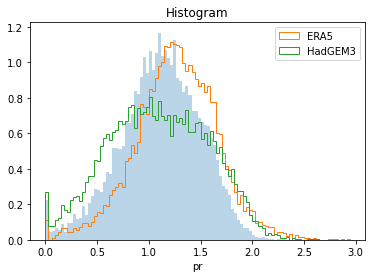

In [149]:
def transform(x):
    #x = x.where(get_land_mask(x)[0])
    #x = x.tas
    x = x.isel(run=0).sel(lon=90, lat=28, method='nearest')
    x = x.pr.clip(None, 75)**0.25
    return x

bins=100

plt.figure()

x_trans = transform(ds_trans)
x_target = transform(ds_target)
x_base = transform(ds_base)

vmin, vmax = range_multi([x_trans, x_target, x_base])

x_trans.plot.hist(bins=bins, histtype='stepfilled', density=True, alpha=0.3, range=(vmin, vmax));
x_target.plot.hist(bins=bins, histtype='step', label='ERA5', density=True, range=(vmin, vmax));
x_base.plot.hist(bins=bins, histtype='step', label='HadGEM3', density=True, range=(vmin, vmax));
plt.legend()

#plt.yscale('log')

plt.show()

"1983-08-11"

In [64]:
x_trans[0]

<xarray.DataArray 'pr' (time: 12600)>
array([0.68800197, 0.53637519, 0.7215331 , ..., 0.45376145, 0.50093283,
       0.51008299])
Coordinates:
    run      int64 1
    lon      float32 77.916664
    lat      float32 8.6111145
  * time     (time) object 1979-01-01 12:00:00 ... 2013-12-30 12:00:00

In [69]:
ds_base.lat.diff(dim='lat')

<xarray.DataArray 'lat' (lat: 67)>
array([0.5555558 , 0.5555558 , 0.55555534, 0.55555534, 0.5555558 ,
       0.5555558 , 0.55555534, 0.5555556 , 0.5555556 , 0.5555556 ,
       0.5555556 , 0.5555556 , 0.5555556 , 0.5555556 , 0.5555556 ,
       0.5555556 , 0.5555556 , 0.5555556 , 0.5555556 , 0.5555556 ,
       0.5555556 , 0.5555558 , 0.55555534, 0.55555534, 0.5555558 ,
       0.5555558 , 0.55555534, 0.55555534, 0.55555534, 0.5555563 ,
       0.55555534, 0.55555534, 0.5555563 , 0.55555534, 0.55555534,
       0.55555534, 0.55555534, 0.5555563 , 0.55555534, 0.55555534,
       0.5555563 , 0.55555534, 0.55555534, 0.55555534, 0.55555534,
       0.55555534, 0.55555534, 0.55555725, 0.55555534, 0.55555534,
       0.55555534, 0.55555534, 0.55555534, 0.55555534, 0.55555725,
       0.55555534, 0.55555534, 0.55555534, 0.55555534, 0.55555534,
       0.55555534, 0.55555534, 0.55555534, 0.55555725, 0.55555534,
       0.55555534, 0.55555534], dtype=float32)
Coordinates:
  * lat      (lat) float32 -6.9444413 -6.3888855 ... 29.166672 29.722227

<Figure size 432x288 with 0 Axes>

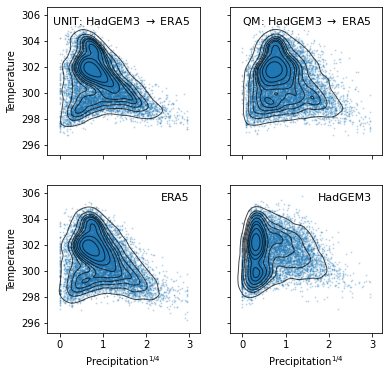

In [24]:
def transform(ds):
    #x = x.where(get_land_mask(x)[0])
    #x = x.tasmin.clip(270, 320)
    ds = ds.isel(run=0).sel(lon=77.5, lat=8.5, method='nearest')#.isel(time=slice(0, 2000))
    x = ds.pr.clip(None, 75)**.25
    y = ds.tas
    return x, y

import matplotlib.patches as patches
import seaborn as sns

plt.figure()

x_trans = transform(ds_trans)
x_target = transform(ds_target)
x_base = transform(ds_base)
x_qm = transform(ds_qm)


fig, axes = plt.subplots(2,2, figsize=(6,6), sharex=True, sharey=True)

def _plot(x, title, ax):
    ax.plot(*x, linestyle='', marker='.', alpha=0.2, markersize=2, zorder=-1);
    ax.text(3,306, title, {'fontsize':11}, ha='right', va='top')

    sns.kdeplot(x=x[0], y=x[1], ax=ax, color='k', linewidths=1, alpha=.7, )

_plot(x_trans, r"UNIT: HadGEM3 $\rightarrow$ ERA5", axes[0,0])
_plot(x_qm, r'QM: HadGEM3 $\rightarrow$ ERA5', axes[0,1])
_plot(x_target, 'ERA5', axes[1,0])
_plot(x_base, 'HadGEM3', axes[1,1])


xlim = range_multi([ds[0] for ds in [x_trans, x_target, x_base]])
ylim = range_multi([ds[1] for ds in [x_trans, x_target, x_base]])

axes[0,0].set_ylabel('Temperature')
axes[1,0].set_ylabel('Temperature')
axes[1,0].set_xlabel(r'Precipitation$^{1/4}$')
axes[1,1].set_xlabel(r'Precipitation$^{1/4}$')
#plt.tight_layout()
for ax in axes.flatten():
    pass
    #ax.set_xlim(xlim[0]-.2, xlim[1]+.2)
    #ax.set_ylim(ylim[0]-1, ylim[1]+1)
    #rect = patches.Rectangle((1.5, 295), 1, 5, linewidth=1, edgecolor='r', facecolor='none')
    #ax.add_patch(rect)
    

plt.show()

In [62]:
fig.savefig('cross-variable-joint-distribution.png', dpi=1000, facecolor='w', edgecolor='w')

In [ ]:
ds_base.pr.mean(dim=('time', 'run'))

In [25]:
forth_root = lambda x: (x**0.25).clip(0, None)
log_trans = lambda x: np.log10(1e-6+x).clip(-1, None)

reverse_forth_root = lambda x: x**4
reverse_log_trans = lambda x: 10**10(x)-1e-6

reverse_none = lambda x: x

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:68: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


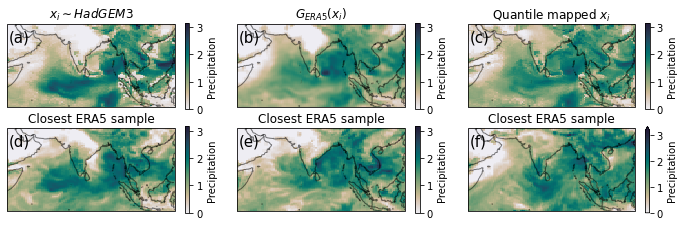

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:68: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


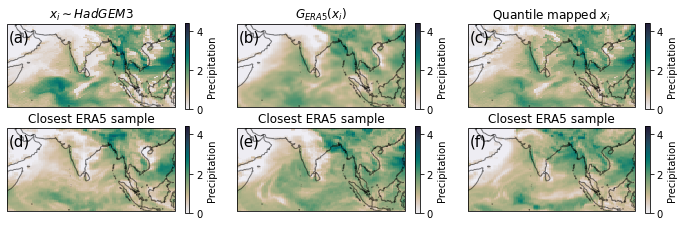

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:68: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


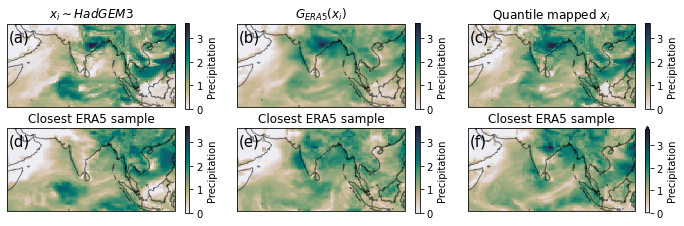

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:68: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


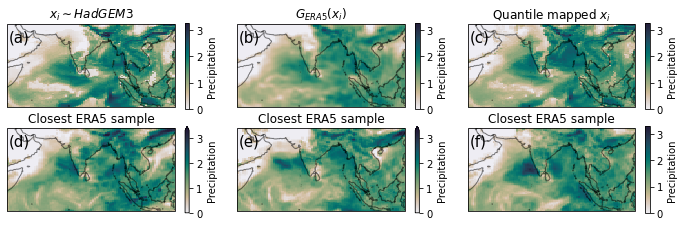

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:68: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


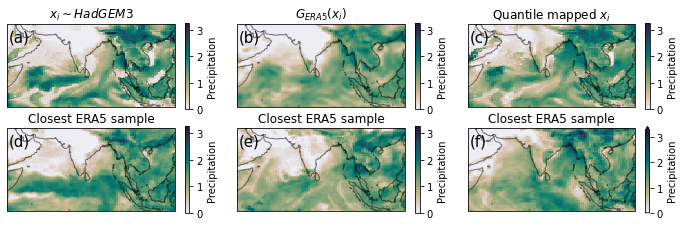

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:68: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


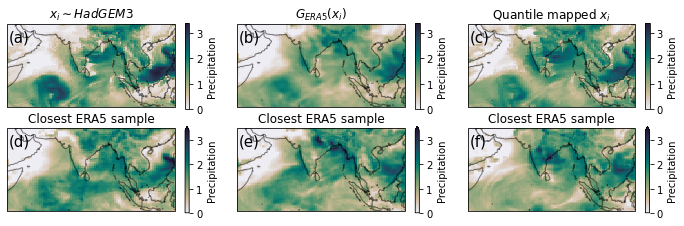

In [156]:
transform = forth_root
reverse_transform = reverse_none
vmin_override = 0 #None #-0.5
vmax_override  = None #40 #2
include_match_for_each=True

ds_target_pr = transform(ds_target.pr.isel(run=0))

for date in [
    "1980-09-07",
    "1980-07-07",
    "1982-08-12",
    "1989-06-12",
    "1994-06-01",
    "1994-07-06",
]:
    
    samples = [transform(ds.pr.isel(run=0).sel(time=date)) for ds in [ds_base, ds_trans, ds_qm]]

    
    plt.figure(figsize=(12,3.5))
    cmap=cmocean.cm.rain
    #titles = ["HadGEM3", f"UNIT translated: HadGEM3 to ERA5", f"QM translated: HadGEM3 to ERA5"]
    titles = [r'$x_i \sim HadGEM3$',
              r'$G_{ERA5}(x_i)$', 
              r'Quantile mapped $x_i$']
    


    vmin, vmax = range_multi(samples)
    if vmin_override is not None:
        vmin = vmin_override
    if vmax_override is not None:
        vmax = vmax_override

    dlon = np.diff(samples[0].lon)[0]
    lon_range = (samples[0].lon.min() - dlon/2, samples[0].lon.max() + dlon/2)

    dlat = np.diff(samples[0].lon)[0]
    lat_range = (samples[0].lat.min() - dlat/2, samples[0].lat.max() + dlat/2)

    for i, (title, letters) in enumerate(zip(titles, ['ad', 'be', 'cf'])):
        ax1 = plt.subplot(231+i, projection=projection)

        cbar_kwargs = dict(label=f"Precipitation")# if i==2 else dict(label=f"")

        reverse_transform(samples[i]).plot(ax=ax1, vmin=vmin, vmax=vmax, cmap=cmap, cbar_kwargs=cbar_kwargs)



        if i==0 or include_match_for_each:
            ax2 = plt.subplot(234+i,projection=projection)
            reverse_transform(
                find_closest(samples[i], ds_target_pr, use_ssim=0
                        )[1]
            ).plot(ax=ax2, vmin=vmin, vmax=vmax, cmap=cmap, cbar_kwargs=cbar_kwargs)

        ax1.set_title(title)
        ax1.text(45,22, f"({letters[0]})", {'fontsize':15})
        ax2.set_title('Closest ERA5 sample')
        ax2.text(45,22, f"({letters[1]})", {'fontsize':15})

        for ax in [ax1, ax2][:1+(i==0 or include_match_for_each)]:
            ax.set_xlim(*lon_range)
            ax.set_ylim(*lat_range)
            ax.coastlines(alpha=0.5)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.show()

In [260]:
import string


'abcdefghijklmnopqrstuvwxyz'

In [13]:
def lat_lon_range(lat_or_lon):
    d = np.diff(lat_or_lon)[0]
    return (lat_or_lon.min() - d/2, lat_or_lon.max() + d/2)


def variable_plot(da_list_top, da_list_bottom, headers, varname, projection=ccrs.PlateCarree(), 
                  cmap=cmocean.cm.rain, vmin=None, vmax=None):
    vs = range_multi([da for da in (da_list_top+da_list_bottom) if da is not None])
    vmin = vmin if vmin else vs[0]
    vmax = vmax if vmax else vs[1]
    
    fig, axes = plt.subplots(2, 3, subplot_kw=dict(projection=projection), figsize=(12,3.5))
    
    cbar_kwargs = dict(label=varname)
    
    lon_range = lat_lon_range(da_list_top[0].lon)
    lat_range = lat_lon_range(da_list_top[0].lat)
    
    for r, da_list in enumerate([da_list_top, da_list_bottom]):
        titles = headers if r==0 else ['Closest ERA5 sample']*3
        
        for i, (title, letter) in enumerate(zip(titles, string.ascii_lowercase[r*3:r*3+3])):
            ax = axes[r, i]
            
            if da_list[i] is not None:
                da_list[i].plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cbar_kwargs=cbar_kwargs)
                ax.set_title(title)
                ax.text(45,22, f"({letter})", {'fontsize':15})

                ax.set_xlim(*lon_range)
                ax.set_ylim(*lat_range)
                ax.coastlines(alpha=0.5)
            else:
                ax.set_frame_on(False)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.show()

In [272]:
transform = log_trans

ds_target_pr = transform(ds_target.pr.isel(run=0))

In [304]:
null_transform = lambda ds_sing, ds: ds_sing

time_demean = lambda ds_sing, ds: ds_sing - ds.mean(dim=('time'))

In [308]:
def plot_variables_on_dates(dates, variables, variable_transforms, include_match_for_each):
    headers = [r'$x_i \sim HadGEM3$',
              r'$G_{ERA5}(x_i)$', 
              r'Quantile mapped $x_i$']
    vmin = None #None #-0.5
    vmax  = None #40 #2
    for date in dates:
        transformed_pr = [transform(ds.pr.isel(run=0).sel(time=date)) for ds in [ds_base, ds_trans, ds_qm]]

        best_match_ntimes = []
        for i, pr in enumerate(transformed_pr):
            if vmin or vmax:
                x = pr.clip(vmin, vmax)
                y = ds_target_pr.clip(vmin, vmax)
            else: 
                x = pr
                y = ds_target_pr

            if include_match_for_each or i==0:
                n, _ = find_closest(x, y, use_ssim=False )
            else:
                n = None
            best_match_ntimes.append(n)


        for v in variables:
            if v=='pr':
                best_match_das = [ds_target_pr.isel(time=n) if n else None for n in best_match_ntimes]
                variable_plot(transformed_pr, best_match_das, headers, varname='Precipitation', cmap=cmocean.cm.rain)
            else:

                best_match_das = [
                    variable_transforms[v](
                        ds_target[v].isel(run=0, time=n), ds_target[v].isel(run=0)
                    ) 
                    if n else None for n in best_match_ntimes
                ]
                da_list = [
                    variable_transforms[v](
                        ds[v].isel(run=0).sel(time=date), ds[v].isel(run=0)
                    ) 
                    for ds in [ds_base, ds_trans, ds_qm]
                ]
                variable_plot(da_list, best_match_das, headers, varname=v, cmap=cmocean.cm.thermal)


/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


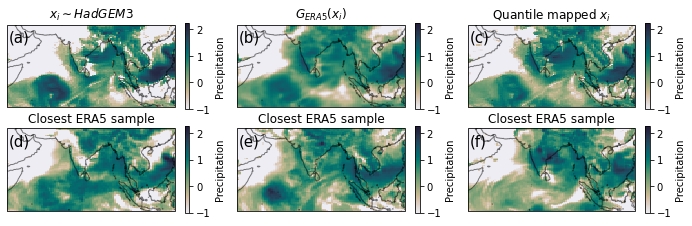

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


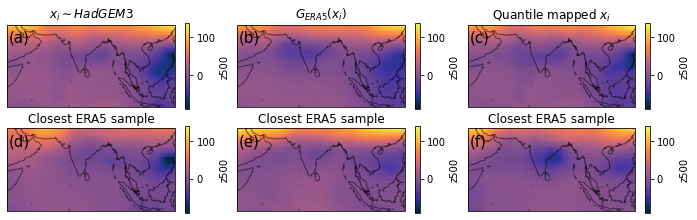

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


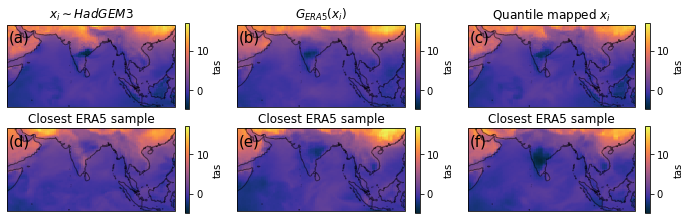

In [307]:
include_match_for_each=True
variables = ['pr', 'z500', 'tas']
variable_transforms = dict(z500=time_demean, tas=spatial_demean)

dates = [
    "1980-09-07",
    "1980-07-07",
    "1982-08-12",
    "1989-06-12",
    "1994-06-01",
    "1994-07-06",
]

plot_variables_on_dates(dates, variables, variable_transforms, include_match_for_each)

In [339]:
def find_pressure_systems(da_z500, n, nlat=10, nlon=10, kind='min'):
    print('de-meaning')
    da_z500 = spatial_demean(da_z500, da_z500)
    print('rolling')
    rolling_mean = da_z500.rolling(lat = nlat).mean().rolling(lon=nlon).mean()
    if kind=='min':
        f = rolling_mean.min
    elif kind=='max':
        f = rolling_mean.max
    elif kind=='minmax':
            f = np.abs(rolling_mean).max
    print('searching')
    times = f(dim=tuple(x for x in list(da_z500.coords) if x!='time')) \
        .to_dataframe(name='z500') \
        .nlargest(n, columns='z500') \
        .index
    return times

In [340]:
min_pressure_system_times = find_pressure_systems(ds_base.z500, n=10, nlat=10, nlon=10, kind='min')

de-meaning
rolling


/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


searching


In [341]:
min_pressure_system_times

CFTimeIndex([1998-05-20 12:00:00, 1993-05-10 12:00:00, 2004-09-29 12:00:00,
             1987-05-25 12:00:00, 1987-05-24 12:00:00, 2010-05-19 12:00:00,
             1987-05-27 12:00:00, 1998-05-21 12:00:00, 1987-05-28 12:00:00,
             1998-05-22 12:00:00],
            dtype='object', name='time')

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


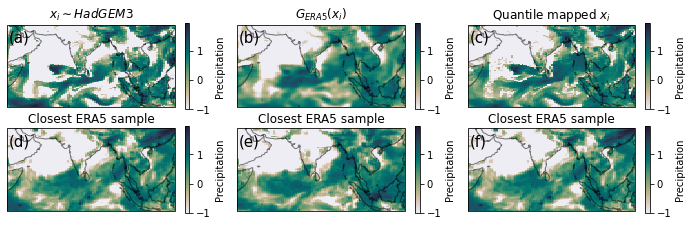

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


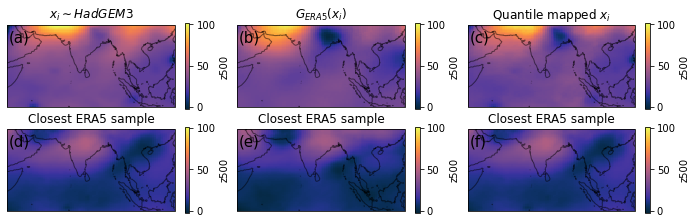

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


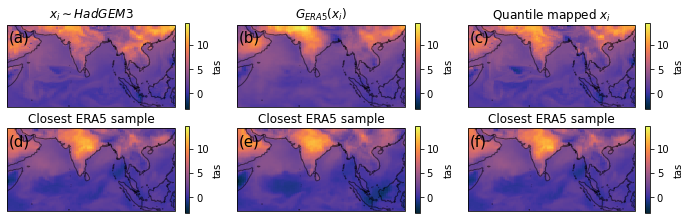

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


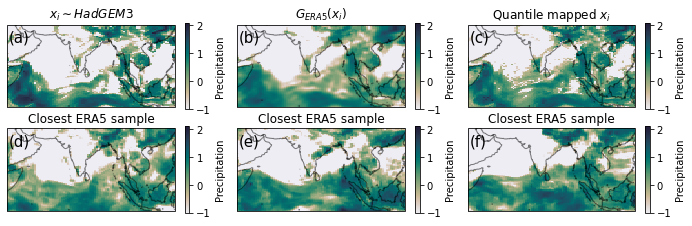

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


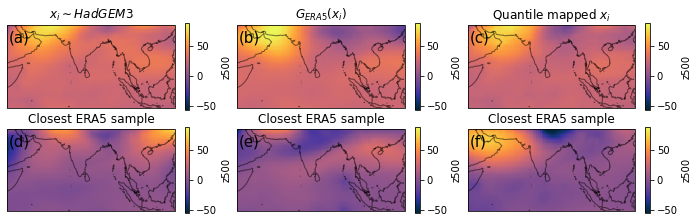

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


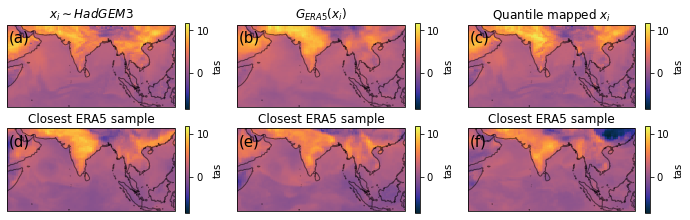

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


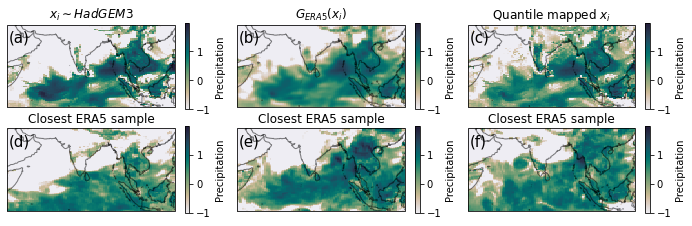

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


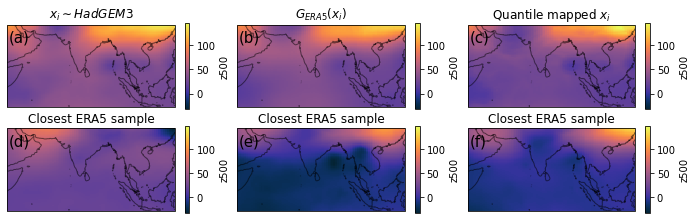

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


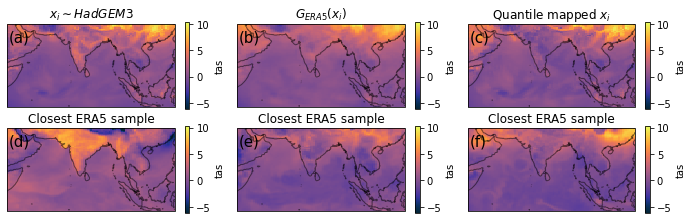

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


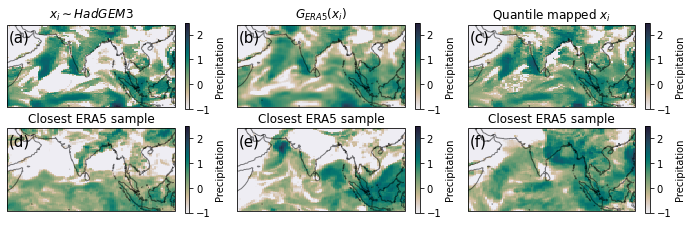

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


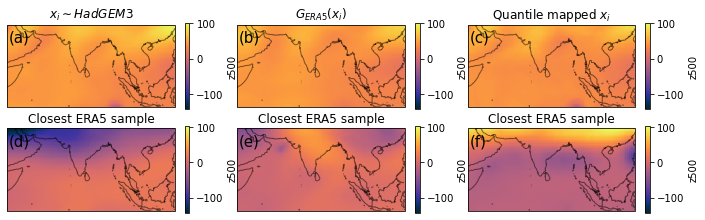

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


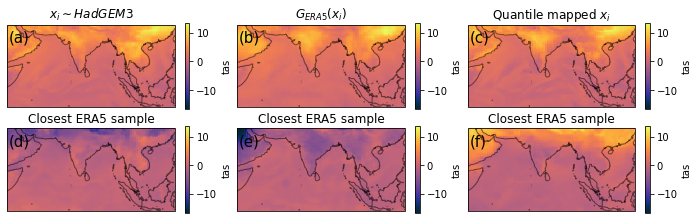

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


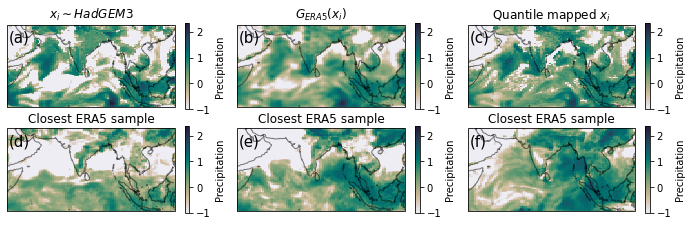

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


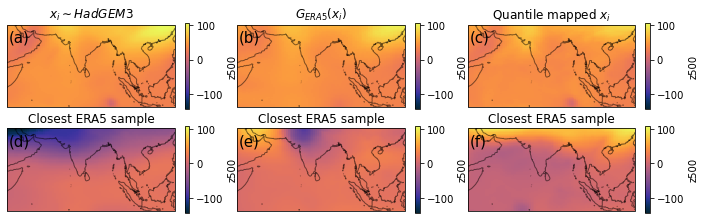

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


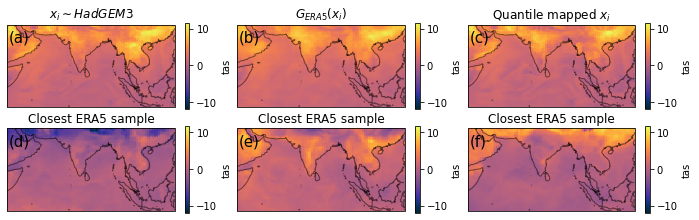

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


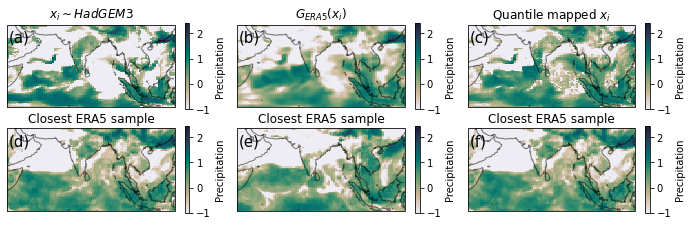

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


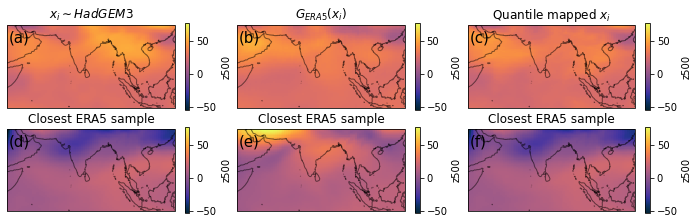

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


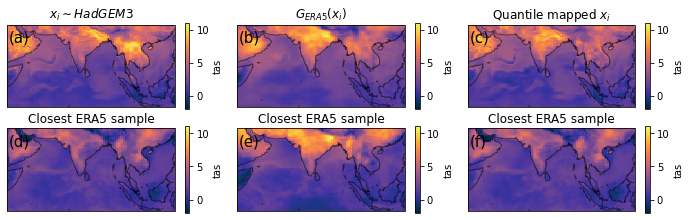

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


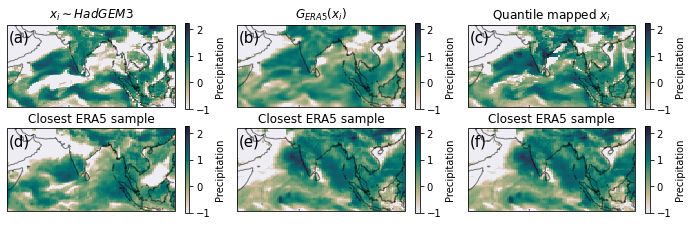

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


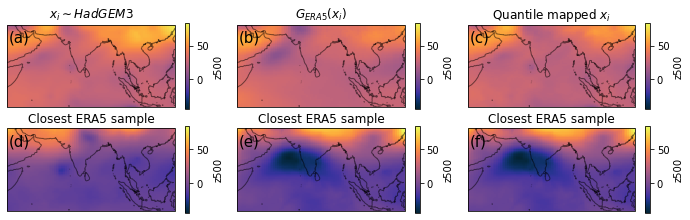

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


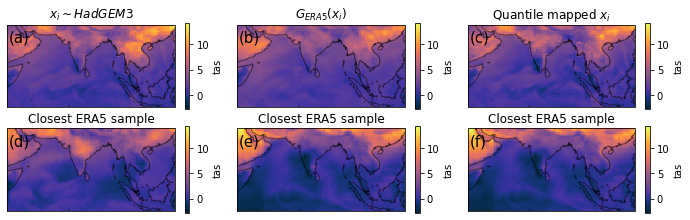

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


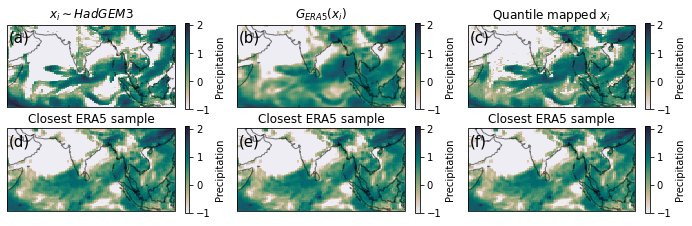

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


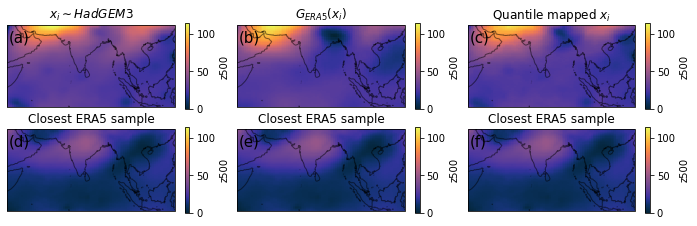

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


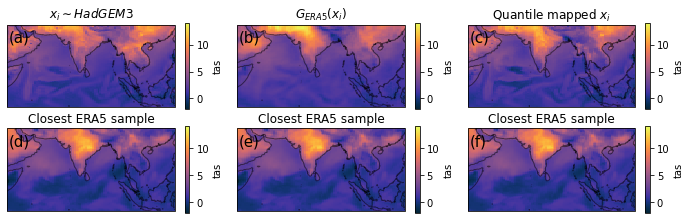

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


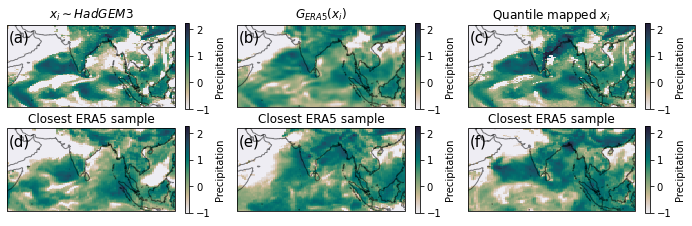

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


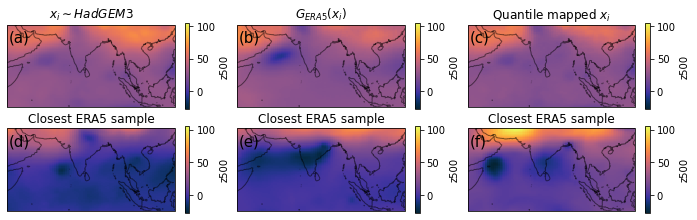

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


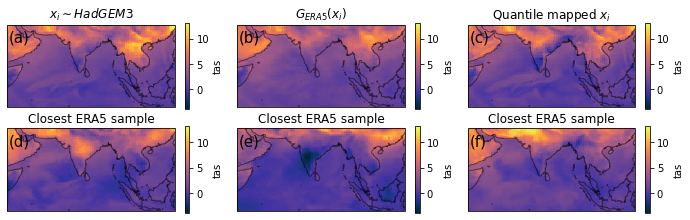

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


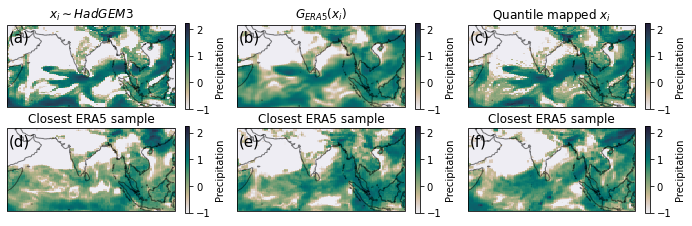

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


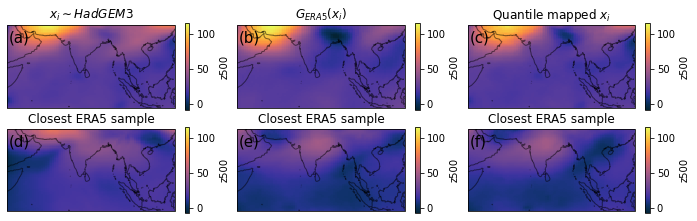

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:36: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


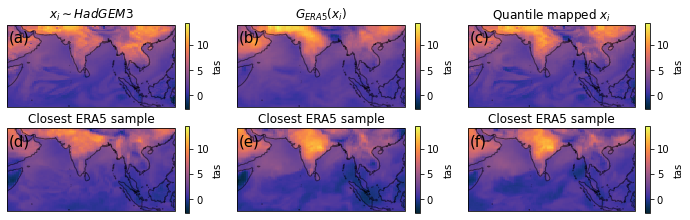

In [342]:
include_match_for_each=True
variables = ['pr', 'z500', 'tas']
variable_transforms = dict(z500=time_demean, tas=spatial_demean)

plot_variables_on_dates(min_pressure_system_times, variables, variable_transforms, include_match_for_each)

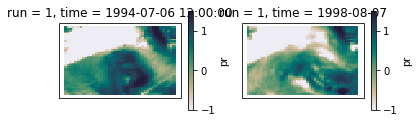

In [44]:
sel=dict(lon=slice(44, 80), lat=slice(-7, 15))

ax1 = plt.subplot(221, projection=projection)
ax2 = plt.subplot(222, projection=projection)

vmin, vmax = -1, 1.5

samples[2].clip(vmin, vmax).sel(**sel).plot(vmin=vmin, vmax=vmax, cmap=cmap, ax=ax1)
find_closest(samples[2].clip(vmin, vmax).sel(**sel), ds_target_pr.clip(vmin, vmax).sel(**sel), use_ssim=1)[1].plot(ax=ax2, vmin=vmin, vmax=vmax, cmap=cmap)

Try these dates for examples
- "1980-09-07"
- "1980-07-07"
- 1982-08-12
- 1989-06-12
- 1994-06-01

In [27]:
results = []
with ProgressBar(dt=10):
    for ds in [ds_target, ds_trans, ds_base]:
        results.append(select_months(ds.pr.isel(run=0).clip(0,None), [6, 7, 8, 9], drop=True).mean(dim='time').compute())

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:42: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


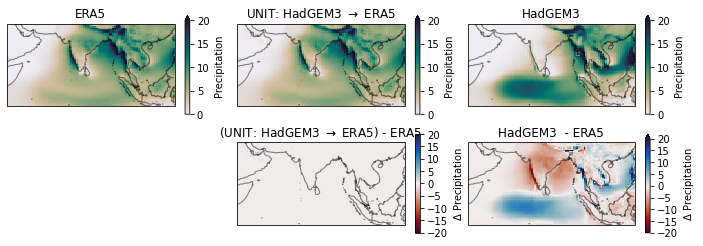

In [28]:
land_mask = False



plt.figure(figsize=(12,4))

axes = [plt.subplot(231+i, projection=ccrs.PlateCarree()) for i in [0,1,2,4,5]]
titles = ["ERA5", 
          f"UNIT: HadGEM3 " + r"$\rightarrow$ " + f"ERA5", 
          "HadGEM3", 
          f"(UNIT: HadGEM3 "  + r"$\rightarrow$ " + f"ERA5) - ERA5",
          f"HadGEM3  - ERA5",]
          
datasets = results+[r-results[0] for r in results[1:]]


abs_range = 0, 20# range_multi(results)
dif_range = -20, 20#range_multi(datasets[-2:])


vmins = [abs_range[0]]*3+[dif_range[0]]*2#[-max(np.abs(dif_range))]*2
vmaxs = [abs_range[1]]*3+[dif_range[1]]*2#[max(np.abs(dif_range))]*2
cmaps=[cmocean.cm.rain]*3+[cmocean.cm.balance_r]*2
norms = [None]*3 + [colors.TwoSlopeNorm(vmin=vmins[-1], vmax=vmaxs[-1], vcenter=0)]*2

i=0
for da, ax, title, vmin, vmax, norm, cmap in zip(datasets, axes, titles, vmins, vmaxs, norms, cmaps):
    lon_range = lat_lon_range(da.lon)
    lat_range = lat_lon_range(da.lat)
    cbar_kwargs = dict(label=f"Precipitation" if i<3 else f"$\Delta$ Precipitation")
    if land_mask:
        da.where(get_land_mask(da)[0]).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, norm=norm, cbar_kwargs=cbar_kwargs)
    else:
        da.plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, norm=norm, cbar_kwargs=cbar_kwargs)
    ax.coastlines(alpha=0.5)
    ax.set_title(title)
    ax.set_xlim(*lon_range)
    ax.set_ylim(*lat_range)
    i+=1
    
    
plt.tight_layout()
plt.subplots_adjust(wspace=0.1)
plt.show()

In [29]:
results = []
with ProgressBar(dt=10):
    for ds in [ds_target, ds_trans, ds_base]:
        results.append(select_months(ds.pr.isel(run=0).clip(0,None)**0.25, [6, 7, 8, 9], drop=True).mean(dim='time').compute())

In [30]:
land_mask = 0



_plot(x_trans, , axes[0,0])
_plot(x_qm, r'QM: HadGEM3 $\rightarrow$ ERA5', axes[0,1])
_plot(x_target, 'ERA5', axes[1,0])
_plot(x_base, 'HadGEM3', axes[1,1])

plt.figure(figsize=(12,5))

axes = [plt.subplot(131+i, projection=ccrs.PlateCarree()) for i in [0,1,2]]
titles = ["ERA5", r"UNIT: HadGEM3 $\rightarrow$ ERA5", 'HadGEM3']
datasets = results

vdiff_abs = 1
vabs_max = 2

vmins = [0]*3+[-vdiff_abs]*2
vmaxs = [vabs_max]*3+[vdiff_abs]*2
cmaps=['Blues']*3+[cmocean.cm.balance_r]*2

for da, ax, title, vmin, vmax, cmap in zip(datasets, axes, titles, vmins, vmaxs, cmaps):
    if land_mask:
        da.where(get_land_mask(da)[0]).plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap)
    else:
        da.plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap)
    ax.coastlines(alpha=0.5)
    ax.set_title(title)
plt.show()

SyntaxError: invalid syntax (<ipython-input-30-732dd2118e1e>, line 5)

In [ ]:
land_mask = True

plt.figure(figsize=(14,3))
axes = [plt.subplot(131+i, projection=ccrs.PlateCarree()) for i in range(3)]
titles = [model, other_model, f"{other_model} to {model}"]
for da, ax, title in zip(results, axes, titles):
    if land_mask:
        da.where(get_land_mask(da)[0]).plot(ax=ax)
    else:
        da.plot(ax=ax)
    ax.coastlines(alpha=0.5)
    ax.set_title(title)
plt.show()

In [ ]:
# this was Jan only
plt.figure(figsize=(14,3))
axes = [plt.subplot(131+i, projection=ccrs.PlateCarree()) for i in range(3)]
titles = [model, other_model, f"{other_model} to {model}"]
for da, ax, title in zip(results, axes, titles):
    da.plot(ax=ax)
    ax.coastlines(alpha=0.5)
    ax.set_title(title)
plt.show()

In [14]:
import cartopy.crs as ccrs
from skimage.metrics import structural_similarity as ssim



def calc_range(das):
    vmin, vmax = common_min_max(das)
    return (vmax - vmin).values

def add_ssim_mae(x1, x2, ax, data_range=None):
    s = ssim(x1, x2, data_range=data_range)
    mae = np.abs(x1 - x2).mean()
    ax.text(0.5, -0.1, 
            f'SSIM: {s:.3f} | MAE: {mae:.3f}', 
            ha='center', 
            va='center', 
            transform=ax.transAxes)

def plot_row(events_das, axes, form):
    vmin, vmax = common_min_max(events_das)
    if form=='relative':
        vmax = max([-vmin, vmax])
        vmin = -vmax
    data_range = calc_range(events_das)
    for e_da, ax in zip(events_das, axes):
        e_da.plot(ax=ax, vmin=vmin, vmax=vmax, cmap='RdBu_r')
        add_ssim_mae(e_da.values, events_das[0].values, ax, data_range=data_range)

def compare_events(event_target, event_trans, event_base, target_model=None, form='relative'):
    plt.figure(figsize=(12, 8))
    axes = [plt.subplot(331+i, projection=ccrs.PlateCarree()) for i in range(9)]
    events = [e.sel(form=form) for e in [event_target, event_trans, event_base]]
    
    plot_row([e.tas for e in events], axes[0:3], form)
    plot_row([e.z500 for e in events], axes[3:6], form)
    plot_row([e.pr for e in events], axes[6:9], form) 
    
    if target_model is None:
        titles = ['target', 'translation', 'base']
    else:
        other_model = ({'era5','hadgem3'} - {target_model}).pop()
        titles = [target_model, f"{other_model} to {target_model}", other_model]
    for ax, title in zip(axes[:3], titles):
        ax.set_title(title)
    for ax in axes[3:]:
        ax.set_title('')
    for ax in axes: ax.coastlines(alpha=0.5)

> Following Hsu et al.[2011], the NHSM region encloses grid boxes for which the mean annual range (difference between the May–September and November–March averages) in precipitation for all years exceeds 2 mm d$^{−1}$ and the mean May–September precipitation exceeds 55% of the annual total. Grid boxes are excluded if they are north of the subtropics (40◦N) or isolated. The region is fixed for all years; therefore, any spatial shift of the monsoon is not captured. However, changes in precipitation due to possible variations inthe monsoon area should be small compared to the total precipitation in the whole region. Figure 2 shows that the NHSM region does not change by much over the observation period, with only a few grid boxes that meet the criteria in at least 1 year excluded from the final NHSM mask. An alternative method would allow the region to change year by year, but this could result in the region changing size, making it difficult to distinguish changes in precipitation rate from changes due to the NHSM region shrinking or growing overtime. The NHSM region is defined for each observational data set, and the model data are masked to match the spatial and temporal coverage of each
> 
> -- https://agupubs.onlinelibrary.wiley.com/doi/10.1002/2014GL060811

In [31]:
# get mask from era5 dataset
for da in [ds_target.pr]:
    da = da.where(get_land_mask(da)[0].numpy().astype(bool)).where(da.lat<=40)
    may_sept_pr = select_months(da.isel(run=0).clip(0,None), [5,6,7,8,9], drop=True).mean(dim='time')
    nov_mar_pr = select_months(da.isel(run=0).clip(0,None), [11,12,1,2,3], drop=True).mean(dim='time')
    yearly_pr = da.isel(run=0).clip(0,None).groupby(da.time.dt.year).sum(dim='time').mean(dim='year')
    monsoon_season_pr = select_months(da.isel(run=0).clip(0,None), [5,6,7,8,9], drop=True)
    monsoon_season_pr = monsoon_season_pr.groupby(monsoon_season_pr.time.dt.year).sum(dim='time').mean(dim='year')
    pr_diff_2 = (may_sept_pr - nov_mar_pr)>2
    pr_055 = monsoon_season_pr > 0.55*yearly_pr
    is_monsoon_gridpoint = xr.ufuncs.logical_and(
        pr_055,
        pr_diff_2
    )

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/xarray/core/nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


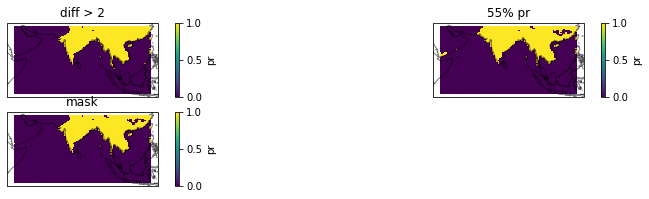

In [32]:

land_mask = True

plt.figure(figsize=(14,3))
for da, title, ax in zip(
    [pr_diff_2, pr_055, is_monsoon_gridpoint],
    ['diff > 2', '55% pr', 'mask'],
    [plt.subplot(221+i, projection=ccrs.PlateCarree()) for i in range(3)]
):
    da.plot(ax=ax)
    ax.coastlines(alpha=0.5)
    ax.set_title(title)
plt.show()


In [33]:
select_months(ds_base.pr.isel(run=0).clip(0,None), [11,12,1,2,3], drop=True).resample(time='1M', loffset='15D').mean()

<xarray.DataArray 'pr' (time: 420, lat: 68, lon: 92)>
array([[[6.71701908e+00, 7.79209471e+00, 9.48971081e+00, ...,
         9.24917412e+00, 7.79524374e+00, 8.75776291e+00],
        [5.74590826e+00, 7.45676565e+00, 9.54552841e+00, ...,
         1.26193399e+01, 1.18355465e+01, 1.03959141e+01],
        [4.46604919e+00, 6.80419588e+00, 8.54671764e+00, ...,
         1.70578403e+01, 1.13497992e+01, 6.44628286e+00],
        ...,
        [1.08538056e-02, 1.65169742e-02, 1.22792404e-02, ...,
         2.25591159e+00, 1.80331457e+00, 1.81068122e+00],
        [1.62720811e-02, 2.45386772e-02, 1.68461073e-02, ...,
         2.97067666e+00, 1.78911185e+00, 1.74504554e+00],
        [1.84595902e-02, 2.43397430e-02, 1.05823157e-02, ...,
         3.85202384e+00, 2.90901470e+00, 2.38694692e+00]],

       [[4.02122879e+00, 5.17352343e+00, 6.17935371e+00, ...,
         1.14163771e+01, 1.25410032e+01, 1.36605225e+01],
        [3.42439866e+00, 5.10311651e+00, 6.05564642e+00, ...,
         1.26836395e+01, 1.39390526e+01, 1.28415499e+01],
        [2.60933566e+00, 3.50380325e+00, 3.76894236e+00, ...,
         1.66040077e+01, 1.17937450e+01, 6.40244532e+00],
...
        [4.51755971e-01, 3.30279350e-01, 1.08254053e-01, ...,
         4.54502296e+00, 4.36265230e+00, 5.22795057e+00],
        [1.96843773e-01, 1.63127467e-01, 8.32360089e-02, ...,
         4.87347317e+00, 5.82927847e+00, 5.18575764e+00],
        [7.28127137e-02, 7.23294243e-02, 6.72879219e-02, ...,
         1.51828372e+00, 2.27930427e+00, 3.44591379e+00]],

       [[4.36681271e+00, 5.46129704e+00, 6.25830698e+00, ...,
         3.46366930e+00, 3.22088027e+00, 2.55947828e+00],
        [3.89308167e+00, 5.30396700e+00, 5.72679186e+00, ...,
         2.95462346e+00, 2.52299190e+00, 1.49060941e+00],
        [3.21260738e+00, 4.27490234e+00, 5.74074650e+00, ...,
         3.68343186e+00, 2.10807872e+00, 1.27713430e+00],
        ...,
        [6.67625740e-02, 5.33966683e-02, 5.97801842e-02, ...,
         3.96049947e-01, 5.60450315e-01, 8.04363310e-01],
        [1.68732211e-01, 1.81589276e-01, 2.46605545e-01, ...,
         4.59061652e-01, 5.63990653e-01, 6.87364459e-01],
        [3.26129705e-01, 3.45810592e-01, 5.88818192e-01, ...,
         6.95279896e-01, 7.05030620e-01, 7.32569158e-01]]], dtype=float32)
Coordinates:
  * time     (time) object 1979-02-15 00:00:00 ... 2014-01-15 00:00:00
  * lon      (lon) float32 44.583332 45.416664 46.25 ... 119.58333 120.416664
  * lat      (lat) float32 -7.499997 -6.9444413 ... 29.166672 29.722227
    run      int64 1

In [34]:
ds_base.time

<xarray.DataArray 'time' (time: 12600)>
array([cftime.Datetime360Day(1979, 1, 1, 12, 0, 0, 0),
       cftime.Datetime360Day(1979, 1, 2, 12, 0, 0, 0),
       cftime.Datetime360Day(1979, 1, 3, 12, 0, 0, 0), ...,
       cftime.Datetime360Day(2013, 12, 28, 12, 0, 0, 0),
       cftime.Datetime360Day(2013, 12, 29, 12, 0, 0, 0),
       cftime.Datetime360Day(2013, 12, 30, 12, 0, 0, 0)], dtype=object)
Coordinates:
  * time     (time) object 1979-01-01 12:00:00 ... 2013-12-30 12:00:00
Attributes:
    axis:           T
    bounds:         time_bnds
    long_name:      time
    standard_name:  time

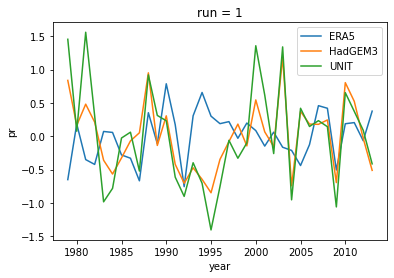

In [35]:
for da, label in zip(
    [ds_target.pr, ds_base.pr, ds_trans.pr, ds_qm.pr],
    ['ERA5', 'HadGEM3', 'UNIT', 'QM']
    
):
    da = select_months(da.isel(run=0).clip(0,None), [5,6,7,8,9], drop=True)
    da = da.groupby(da.time.dt.year).mean()
    da = da.where(is_monsoon_gridpoint).mean(dim=('lat', 'lon'))
    da = da - da.mean()
    if label=='QM': break
    da.plot(label=label)
plt.legend()
plt.show()


Looks like there is no signal to be able to capture anyway

## What do the pressure systems look like when it rains in monsoon months?


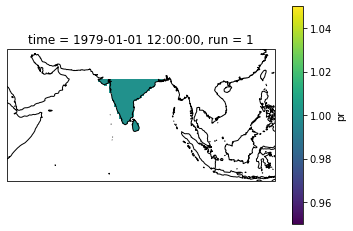

In [36]:
projection=ccrs.PlateCarree()

def get_land(ds):
    return ds.where(get_land_mask(ds)[0]).where((ds.lon>68)&(ds.lon<90)&(ds.lat<22))

ax = plt.subplot(111, projection=projection)
get_land(ds_base['pr'].isel(time=0, run=0)).clip(1,1).plot(ax=ax)
ax.coastlines()
plt.show()

In [37]:
ds_rainy_list = []

rain_titles =  [
    "HadGEM3", 
    "ERA5", 
    r"G(x) HadGEM3 $\rightarrow$ ERA5", 
    r"QM(x) HadGEM3 $\rightarrow$ ERA5", 
]

for ds in [ds_base, ds_target, ds_trans, ds_qm]:

    ds = ds.isel(run=0)
    ds = select_months(ds, [6, 7, 8, 9], drop=True)
    land_precip = get_land(ds).pr.mean(dim=('lat', 'lon'))
    rainy_times = land_precip.to_dataframe().nsmallest(int(0.2*len(ds.time)), columns='pr').index
    ds_rainy_list += [ds.sel(time=rainy_times).mean(dim='time')]
    

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:26: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


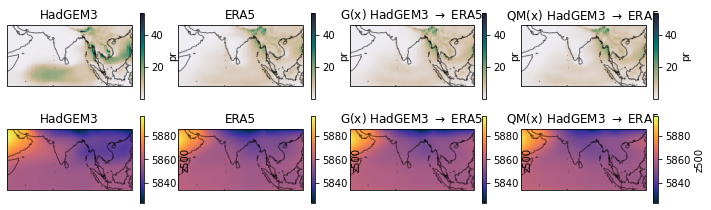

In [38]:
variables = ['pr', 'z500']
cmaps = [cmocean.cm.rain, cmocean.cm.thermal]


fig, axes = plt.subplots(2, 4, subplot_kw=dict(projection=projection), figsize=(12,3.5))

lon_range = lat_lon_range(ds_rainy_list[0].lon)
lat_range = lat_lon_range(ds_rainy_list[0].lat)

for r, v in enumerate(variables):
    vmin, vmax = range_multi([ds[v] for ds in ds_rainy_list])
    cmap = cmaps[r]
    
    for i, (title, ds) in enumerate(zip(rain_titles, ds_rainy_list)):
                                               
        ax = axes[r, i]

        ds[v].plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(title)

        ax.set_xlim(*lon_range)
        ax.set_ylim(*lat_range)
        ax.coastlines(alpha=0.5)


plt.tight_layout()
plt.subplots_adjust(wspace=0.1)
plt.show()

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:27: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


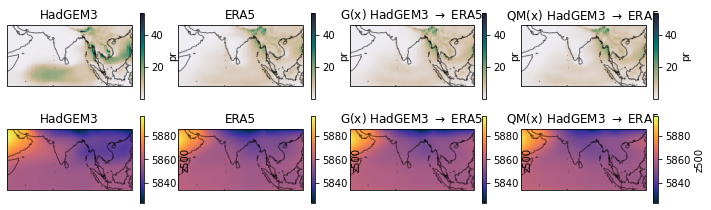

In [40]:

variables = ['pr', 'z500']
cmaps = [cmocean.cm.rain, cmocean.cm.thermal]


fig, axes = plt.subplots(2, 4, subplot_kw=dict(projection=projection), figsize=(12,3.5))

lon_range = lat_lon_range(ds_rainy_list[0].lon)
lat_range = lat_lon_range(ds_rainy_list[0].lat)

for r, v in enumerate(variables):
    vmin, vmax = range_multi([ds[v] for ds in ds_rainy_list])
    cmap = cmaps[r]
    
    for i, (title, ds) in enumerate(zip(rain_titles, ds_rainy_list)):
                                               
        ax = axes[r, i]

        ds[v].plot(ax=ax, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(title)

        ax.set_xlim(*lon_range)
        ax.set_ylim(*lat_range)
        ax.coastlines(alpha=0.5)


plt.tight_layout()
plt.subplots_adjust(wspace=0.1)
plt.show()

In [35]:
ds_rainy.pr.plot()

NameError: name 'ds_rainy' is not defined

In [36]:
ds_rainy.z500.plot()

NameError: name 'ds_rainy' is not defined

# Find scores of matching

In [11]:
import cupy as cp
mempool = cp.get_default_memory_pool()
mempool.free_all_blocks()

In [12]:
f"{int(mempool.total_bytes()*1e-6):,}MB"

'0MB'

In [13]:
def mse_best_match(x_ref, x_search):
    x = x_ref[None, ...]
    y =  x_search[:, None, ...]
    s = ((x - y)**2).mean(axis=(-1,-2)).min(axis=0)
    return s

def mae_best_match(x_ref, x_search):
    x = x_ref[None, ...]
    y =  x_search[:, None, ...]
    s = cp.abs(x - y).mean(axis=(-1,-2)).min(axis=0)
    return s

In [14]:
import cupyx.scipy.signal as signal


def gaussian(window_size, sigma):
    gauss = cp.exp(-(cp.arange(window_size) - window_size//2)**2/float(2*sigma**2))
    return gauss/gauss.sum()

def create_window(window_size):
    _1D_window = gaussian(window_size, 1.5)[:, None]
    _2D_window = _1D_window.dot(_1D_window.T)
    return _2D_window[None, None]


def _ssim(img1, img2, window_size=11):
    
    mn = min(img1.min(), img2.min())
    mx = max(img1.max(), img2.max())
    R = 1
    
    img1 = (img1[:,None] - mn)/(mx-mn)
    img2 = (img2[None] - mn)/(mx-mn)
    window = create_window(window_size)[None,...]
    
    mu1 = signal.fftconvolve(img1, window, mode='same', axes=(-1,-2))
    mu2 = signal.fftconvolve(img2, window, mode='same', axes=(-1,-2))

    mu1_sq = mu1**2
    mu2_sq = mu2**2
    mu1_mu2 = mu1*mu2
    
    sigma1_sq = signal.fftconvolve(img1*img1, window, mode='same', axes=(-1,-2)) - mu1_sq
    sigma2_sq = signal.fftconvolve(img2*img2, window, mode='same', axes=(-1,-2)) - mu2_sq
    sigma12 = signal.fftconvolve(img1*img2, window, mode='same', axes=(-1,-2)) - mu1_mu2

    K1 = 0.01**2
    K2 = 0.03**2
    
    C1 = (K1 * R) ** 2
    C2 = (K2 * R) ** 2

    ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))
    
    ssim_score = ssim_map.mean(axis=(-1, -2, -3))

    return ssim_score

def ssim_best_match(x_ref, x_search):
    return _ssim(x_ref[:, None], x_search[:, None], window_size=11).max(axis=1)
    

In [15]:
import cupyx.scipy.signal as signal


def gaussian(window_size, sigma):
    gauss = cp.exp(-(cp.arange(window_size) - window_size//2)**2/float(2*sigma**2))
    return gauss/gauss.sum()

def create_window(window_size):
    _1D_window = gaussian(window_size, 1.5)[:, None]
    _2D_window = _1D_window.dot(_1D_window.T)
    return _2D_window[None, None]


def _ssim(img1, img2, window_size=11, R=1):
    
    K1 = 0.01**2
    K2 = 0.03**2
    
    C1 = (K1 * R) ** 2
    C2 = (K2 * R) ** 2
    
    img1 = img1[:,None]
    img2 = img2[None]
    window = create_window(window_size)[None,...]
    
    mu1 = signal.fftconvolve(img1, window, mode='same', axes=(-1,-2))
    mu2 = signal.fftconvolve(img2, window, mode='same', axes=(-1,-2))

    mu1_mu2 = mu1*mu2
    sigma12 = signal.fftconvolve(img1*img2, window, mode='same', axes=(-1,-2)) - mu1_mu2
    
    ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))
    del sigma12, mu1_mu2
    
    mu1_sq = mu1**2
    mu2_sq = mu2**2
    
    
    
    sigma1_sq = signal.fftconvolve(img1*img1, window, mode='same', axes=(-1,-2)) - mu1_sq
    sigma2_sq = signal.fftconvolve(img2*img2, window, mode='same', axes=(-1,-2)) - mu2_sq
    
    sigs = sigma1_sq + sigma2_sq
    del sigma1_sq, sigma2_sq
    
    mus = mu1_sq + mu2_sq
    del mu1_sq, mu2_sq
    
    denom = (mus + C1)*(sigs + C2)
    del mus, sigs
    
    ssim_map = ssim_map/denom
    
    ssim_score = ssim_map.mean(axis=(-1, -2, -3))
    
    del ssim_map

    return ssim_score

def ssim_best_match(x_ref, x_search):
    return _ssim(x_ref[:, None], x_search[:, None], window_size=11).max(axis=1)
    

In [16]:
import time
from tqdm import tqdm

def transform(x):
    #x = x.where(get_land_mask(x)[0])
    #x = x.tasmin.clip(270, 320)
    x = x.clip(None, 75)**0.25
    return x


variables = ['pr', 'z500', 'tas']
titles = ['base', 'trans', 'qm']
datasets = [ds_base, ds_trans, ds_qm]
funcs = [ssim_best_match]#[mse_best_match, mae_best_match, ssim_best_match]
results_dict = {t:{f.__name__:{} for f in funcs} for t in titles}

Ns=[1]#[10,10,1]
y=None
x = None
x_part=None

def printt(x):
    print(x, time.ctime())

for (N, func) in zip(Ns, funcs):
    printt(func.__name__)
    for variable in variables:
        printt(f'    {variable}')
        del y
        if variable=='pr': 
            y = transform(ds_target[variable].isel(run=0).values)
        else:
            y = ds_target[variable].isel(run=0).values
        if func==ssim_best_match:
            mn = min(y.min(), y.min())
            mx = max(y.max(), y.max())
            y = (y - mn)/(mx - mn)
            
        y = cp.array(y, dtype=np.float32)
            
        for title, ds in zip(titles, datasets):
            printt(f"        {title}")
            results_dict[title][func.__name__][variable] = []
            del x
            x = ds[variable].isel(run=0)
            if func==ssim_best_match:
                x = (x - mn)/(mx - mn)
            
            for i in tqdm(range(int(np.ceil(x.time.shape[0]//N)))):
                del x_part
                if variable=='pr':
                    x_part = transform(cp.array(x.isel(time=slice(i*N, i*N+N)).values, dtype=np.float32))
                else:
                    x_part = cp.array(x.isel(time=slice(i*N, i*N+N)).values, dtype=np.float32)
                s = func(x_part, y).get()
                results_dict[title][func.__name__][variable] += [s]

ssim_best_match Wed Oct  6 14:13:36 2021
    pr Wed Oct  6 14:13:36 2021
        base Wed Oct  6 14:13:44 2021


100%|██████████| 12600/12600 [38:06<00:00,  5.51it/s]


        trans Wed Oct  6 14:51:51 2021


100%|██████████| 12600/12600 [38:07<00:00,  5.51it/s]


        qm Wed Oct  6 15:29:59 2021


100%|██████████| 12600/12600 [38:06<00:00,  5.51it/s]


    z500 Wed Oct  6 16:08:05 2021
        base Wed Oct  6 16:08:07 2021


100%|██████████| 12600/12600 [38:04<00:00,  5.51it/s]


        trans Wed Oct  6 16:46:12 2021


100%|██████████| 12600/12600 [38:05<00:00,  5.51it/s]


        qm Wed Oct  6 17:24:20 2021


100%|██████████| 12600/12600 [38:05<00:00,  5.51it/s]


    tas Wed Oct  6 18:02:27 2021
        base Wed Oct  6 18:02:42 2021


100%|██████████| 12600/12600 [38:05<00:00,  5.51it/s]


        trans Wed Oct  6 18:40:48 2021


100%|██████████| 12600/12600 [38:06<00:00,  5.51it/s]


        qm Wed Oct  6 19:19:25 2021


100%|██████████| 12600/12600 [38:05<00:00,  5.51it/s]


In [23]:
import pickle

In [24]:
ls

001-explore_hadgem3_and_cam5.ipynb     008c-v8.1_monsoons_only-Copy1.ipynb
002-animate_cam5_translation.ipynb     008d-v8.5_monsoons_only.ipynb
003-evaluate_cma2had_4ch.ipynb         009-global_had2era.ipynb
004-evaluate_cam2had_v3.ipynb          cross-variable-joint-distribution.png
005-evaluate_cam2had_v3_indices.ipynb  results_dict.pkl
006-preesure_and_temp_eu.ipynb         results_dict2.pkl
007-monsoons.ipynb                     results_dicta.pkl
008-monsoons_only.ipynb                results_dicta2.pkl
008b-v8_monsoons_only.ipynb


In [ ]:
with open ('results_dicta2.pkl', 'wb') as f:
    pickle.dump(results_dict, f)

In [30]:
with open ('results_dicta.pkl', 'rb') as f:
    results_dict = pickle.load(f)

In [31]:
with open ('results_dicta2.pkl', 'rb') as f:
    results_dict2 = pickle.load(f)

In [32]:
results_dict.keys()

dict_keys(['base', 'trans', 'qm'])

In [33]:
for k1, v1 in results_dict2.items():
    for k2, v2 in v1.items():
        results_dict[k1][k2] = v2

In [34]:
results_dict['base'].keys()

dict_keys(['mse_best_match', 'mae_best_match', 'ssim_best_match'])

In [35]:
for k1, v1 in results_dict.items():
    for k2, v2 in v1.items():
        for k3, v3 in v2.items():
            try:
                results_dict[k1][k2][k3] = np.concatenate(v3)
            except:
                print(k1,k2,k3)

1.0000011757887868
1.0000013825017968
0.9999998063260598


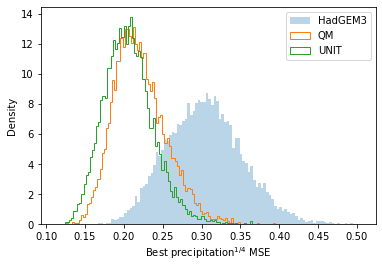

0.9999999318159764
0.9999999340939846
1.0000001076367608


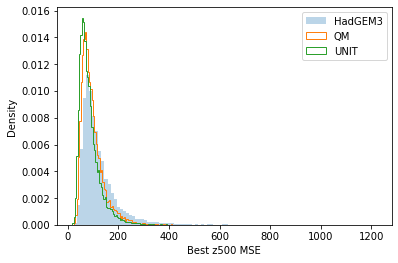

0.9999992280541476
0.9999991149372593
0.9999991830819716


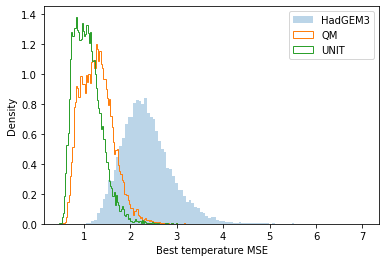

1.0000017865693893
1.0000006432946442
1.0000034871842185


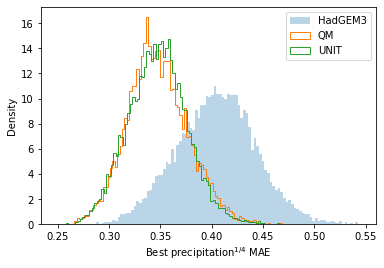

0.9999988630704671
0.9999996121222207
0.9999993167579888


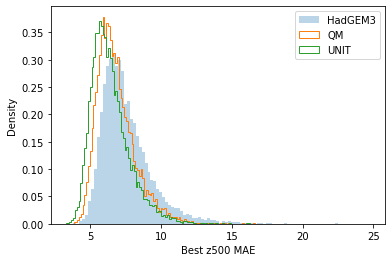

1.0000014012636562
0.9999969201106603
1.0000019426660487


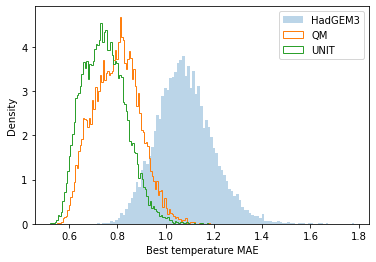

1.0000000000000004
1.0000000000000013
1.0000000000000049


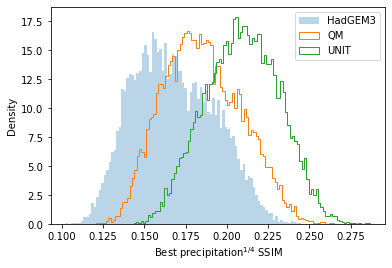

0.9999999999999921
1.0
1.0000000000000102


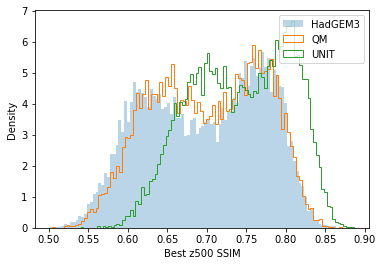

0.9999999999999856
0.9999999999999802
1.0000000000000075


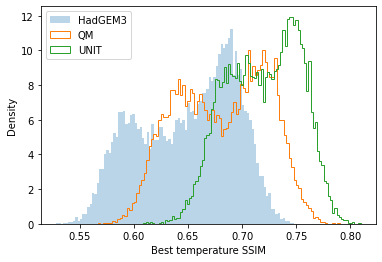

In [38]:
titles = ['base',  'qm', 'trans', ]

data_names = ['HadGEM3',  'QM', 'UNIT', ]
variables = ['pr', 'z500', 'tas']
variable_names = ['precipitation$^{1/4}$', 'z500', 'temperature']

metric_names = ["MSE", "MAE", "SSIM"]
func_names = [f.__name__ for f in [mse_best_match, mae_best_match, ssim_best_match]]


for func_name, metric_name in zip(func_names, metric_names):
    for variable, var_name in zip(variables, variable_names):
        plt.figure(figsize=(6,4))
        for title, data_name in zip(titles, data_names):
            x = results_dict[title][func_name].get(variable, None)
            if x is None: continue
            histtype = 'step' if title!='base' else 'stepfilled'
            alpha = 1 if title!='base' else .3
            r = plt.hist(x, bins=100, label=data_name, histtype=histtype, alpha=alpha, density=True)
            print(np.diff(r[1])[0]*r[0].sum())
        plt.xlabel(f"Best {var_name} {metric_name}")
        plt.ylabel('Density')
        plt.legend()
        plt.show()

The above plots tell us that the UNIT data is spatially more similar

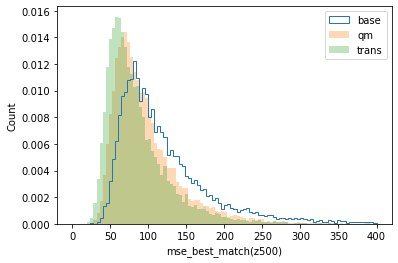

In [39]:
variable='z500'
func_name = mse_best_match.__name__

plt.figure()
for title in titles:
    x = results_dict[title][func_name].get(variable, None)
    if x is None: continue
    histtype = 'step' if title=='base' else 'stepfilled'
    alpha = 1 if title=='base' else 0.3
    plt.hist(x, bins=100, label=title, histtype=histtype, alpha=alpha, range=(0, 400), density=True)
plt.xlabel(f"{func_name}({variable})")
plt.ylabel('Count')
plt.legend()
plt.show()


| N_      | time taken  |
| ------- | ----------- |
|   50    | 22          |
|   40    | 17.9 s      |
|   20    | 7 s         |
|   10    | 3.9 s       |

In [20]:
def all_ssim_best_match(x_ref, x_search):
    return - _ssim(x_ref[:, None], x_search[:, None], window_size=11)

In [21]:
def all_mse_best_match(x_ref, x_search):
    x = x_ref[None, ...]
    y =  x_search[:, None, ...]
    s = ((x - y)**2).mean(axis=(-1,-2))
    return s

def all_mae_best_match(x_ref, x_search):
    x = x_ref[None, ...]
    y =  x_search[:, None, ...]
    s = cp.abs(x - y).mean(axis=(-1,-2))
    return s

In [24]:
def transform(x):
    #x = x.where(get_land_mask(x)[0])
    #x = x.tasmin.clip(270, 320)
    x = x.clip(None, 75)**0.25
    return x

variable='pr'

funcs = [all_mse_best_match, all_mae_best_match, all_ssim_best_match]
all_scores_dict = {}

y = transform(ds_base[variable]).isel(run=0).values
x = transform(ds_base[variable]).isel(run=0).mean(dim='time', keepdims=True)

y = cp.array(y, dtype=np.float32)
x = cp.array(x, dtype=np.float32)

mn = min(y.min(), y.min())
mx = max(y.max(), y.max())
y = (y - mn)/(mx - mn)
mn = min(x.min(), x.min())
mx = max(x.max(), x.max())
x = (x - mn)/(mx - mn)     

for func in funcs:

    s = func(x, y).get()
    all_scores_dict[func.__name__] = s

In [58]:
all_scores_dict

{'all_mse_best_match': array([[0.08893611],
        [0.09466348],
        [0.10085681],
        ...,
        [0.13056266],
        [0.1388869 ],
        [0.14694491]], dtype=float32),
 'all_mae_best_match': array([[0.24015024],
        [0.24677528],
        [0.25269854],
        ...,
        [0.2994999 ],
        [0.30779955],
        [0.3201072 ]], dtype=float32),
 'all_ssim_best_match': array([[-0.1477143 , -0.14906399, -0.13045727, ..., -0.14385104,
         -0.15197056, -0.13837553]])}

In [55]:
def lowest_value_times(scores, times):
    order = np.array([x for _, x in sorted(zip(scores, np.arange(scores.shape[0])))])
    return times.isel(time=order)

In [59]:
best_matching_times_dict = {k:lowest_value_times(v.flatten(), ds_base.time) for k, v in all_scores_dict.items()}

In [107]:
def take_best_n(best_times_dict, n, start_index=None):
    def check(z):
        if isinstance(z, int):
            z_list = [z]*len(best_times_dict)
        else:
            assert isinstance(z, list) and len(z)==len(best_times_dict)
            z_list = z
        return z_list
    
    n_list = check(n)
    if start_index is not None:
        start_list = check(start_index)
    else:
        start_list = [0]*len(best_times_dict)
    
    times_list = []
    for n, s, (k, v) in zip(n_list, start_list, best_times_dict.items()):
        times_list += [v.values[s:s+n]]
    ts, cs = np.unique(np.concatenate(times_list), return_counts=True)
    return np.array([t for c, t in sorted(zip(-cs, ts))])

In [110]:
try_times = take_best_n(best_matching_times_dict, 10, start_index=10)

In [111]:
try_times_str = [str(t).split(' ')[0] for t in try_times]
try_times_str

['1984-06-23',
 '1988-07-05',
 '1988-07-20',
 '1988-07-23',
 '1988-08-07',
 '1988-08-08',
 '1992-06-20',
 '1993-06-20',
 '1993-06-22',
 '1996-06-26',
 '1996-06-27',
 '1996-06-28',
 '1996-06-29',
 '1996-07-02',
 '1996-07-04',
 '1999-08-21',
 '2000-06-13',
 '2000-09-05',
 '2001-06-11',
 '2002-06-14',
 '2004-07-07',
 '2004-07-08',
 '2005-08-17',
 '2007-06-20',
 '2007-06-21',
 '2007-06-22',
 '2008-06-30',
 '2008-07-25',
 '2012-08-20',
 '2013-07-06']

In [112]:
forth_root = lambda x: (x**0.25).clip(0, None)
log_trans = lambda x: np.log10(1e-6+x).clip(-1, None)

reverse_forth_root = lambda x: x**4
reverse_log_trans = lambda x: 10**10(x)-1e-6

reverse_none = lambda x: x

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


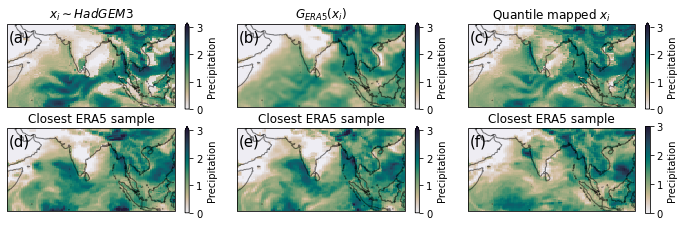

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


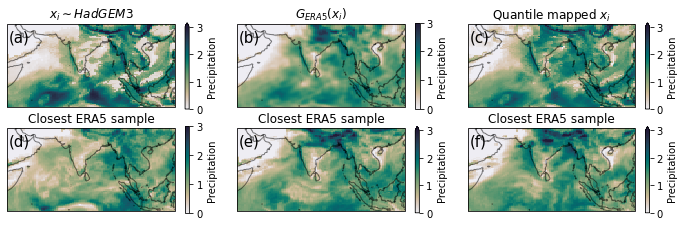

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


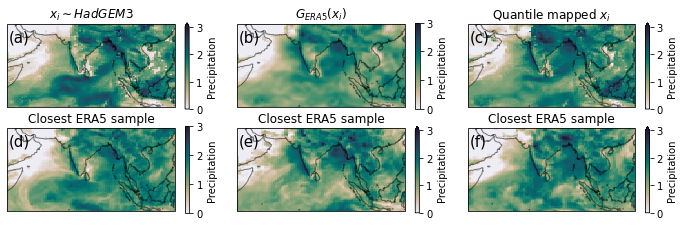

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


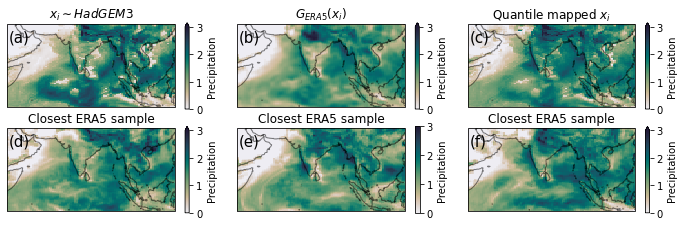

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


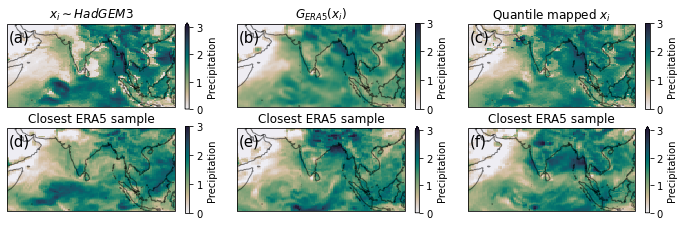

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


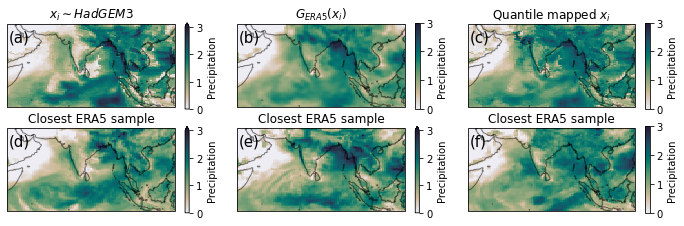

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


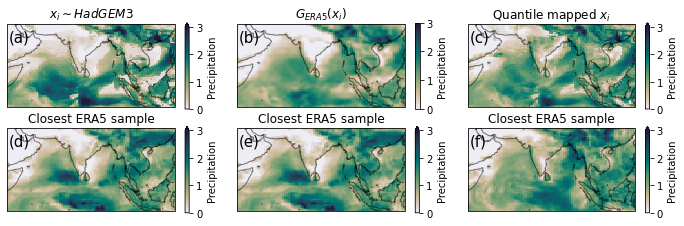

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


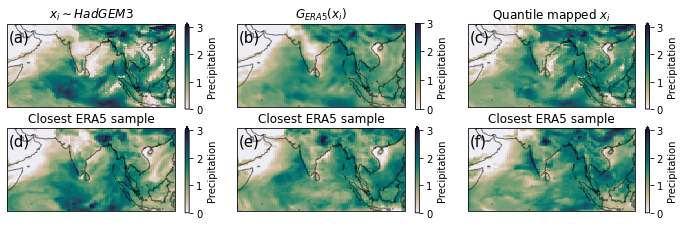

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


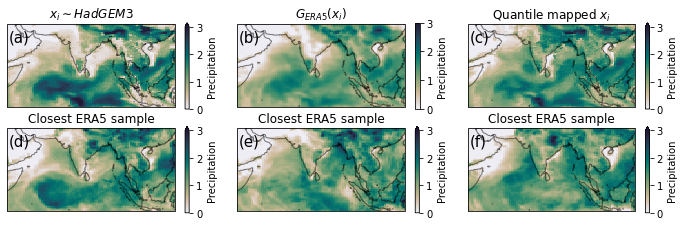

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


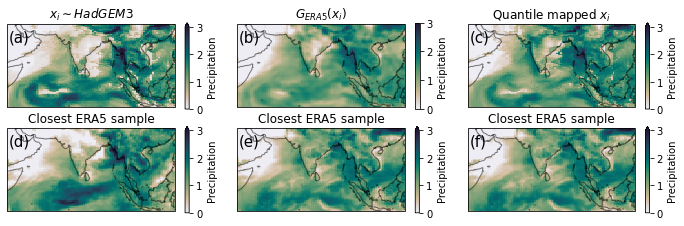

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


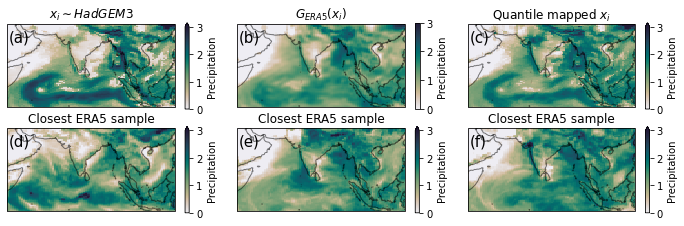

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


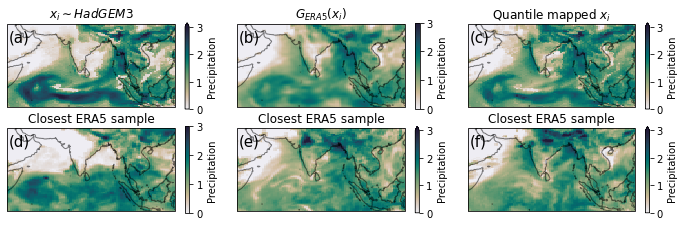

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


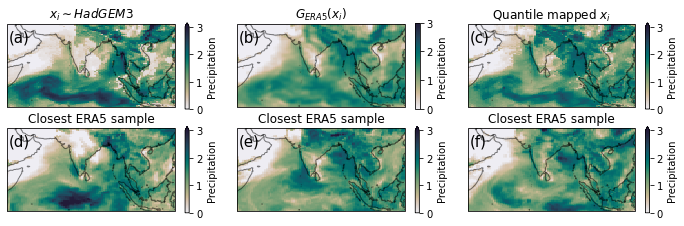

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


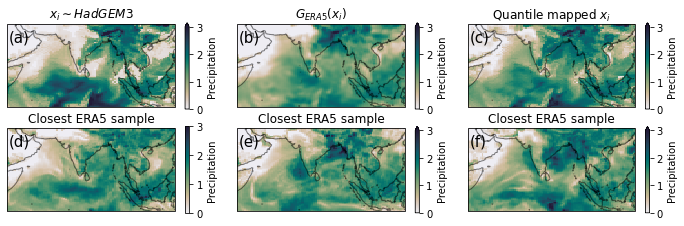

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


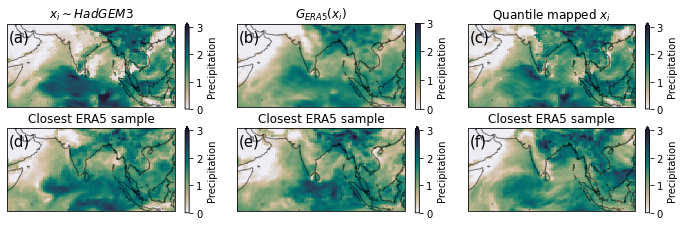

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


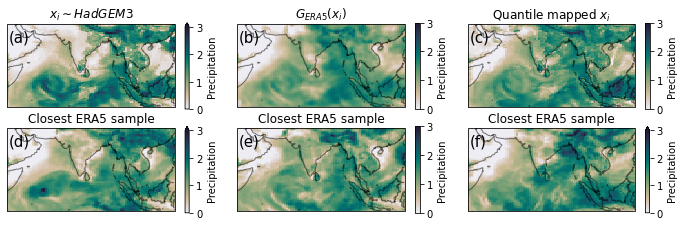

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


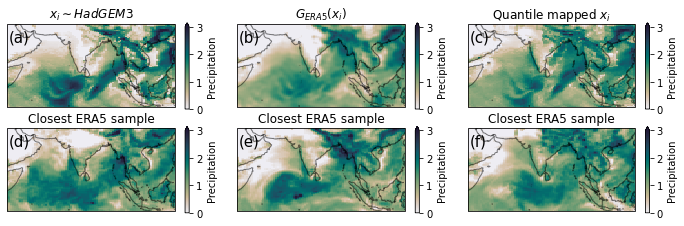

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


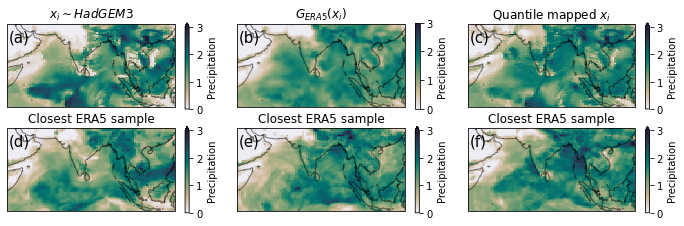

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


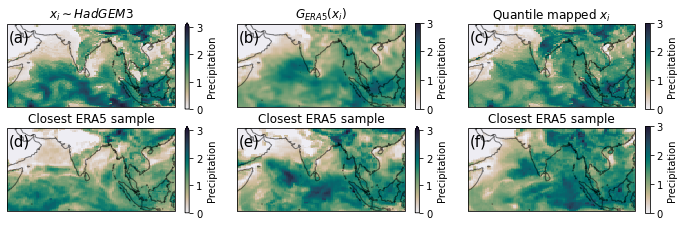

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


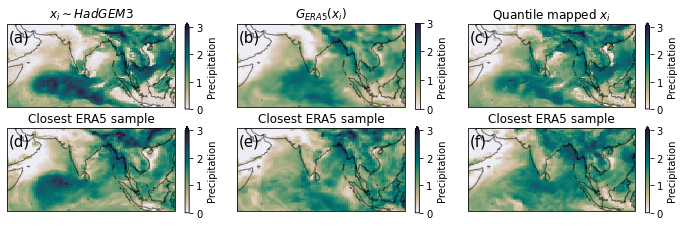

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


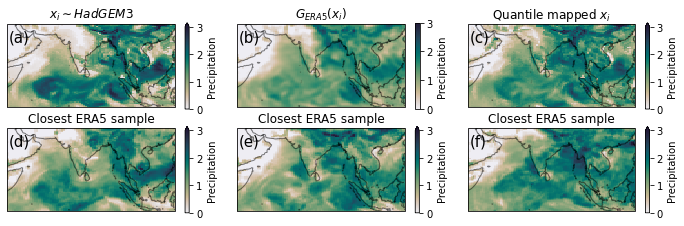

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


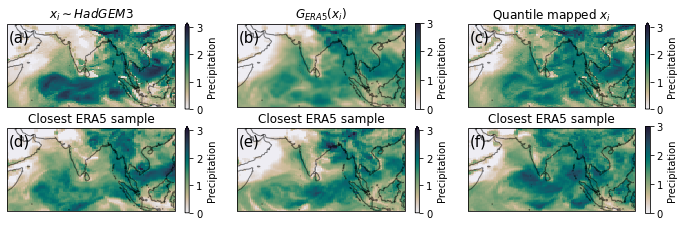

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


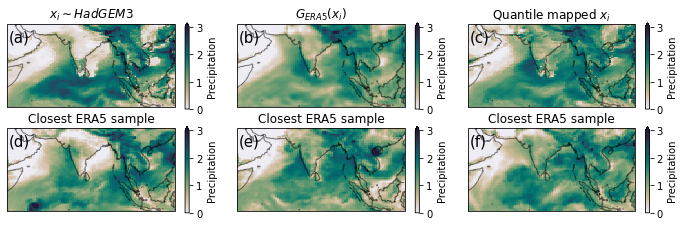

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


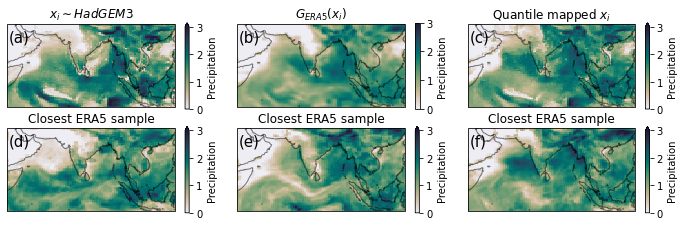

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


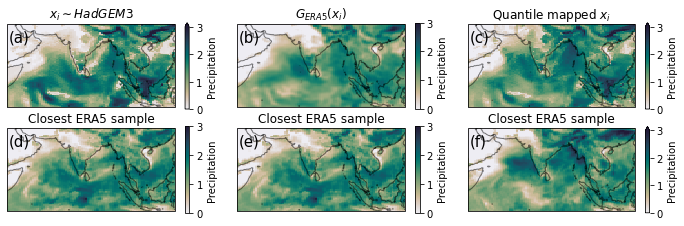

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


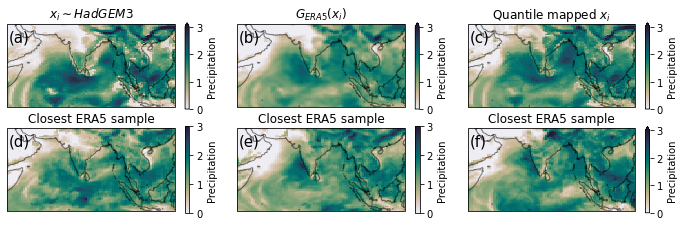

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


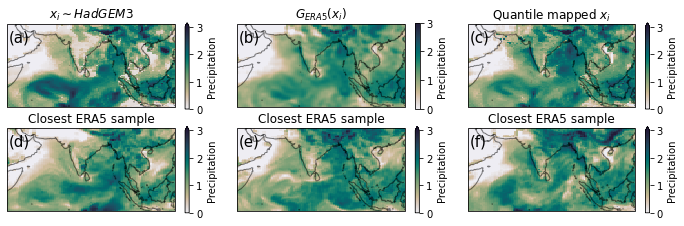

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


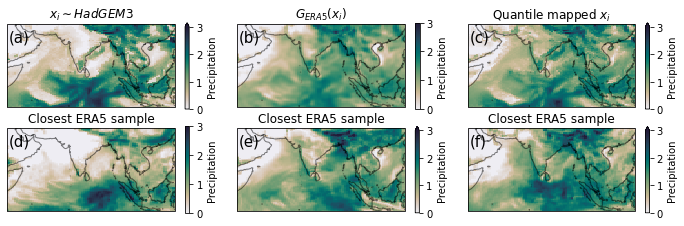

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


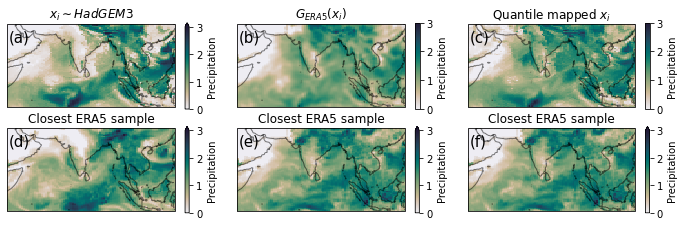

/anaconda/envs/py37_pytorch2/lib/python3.7/site-packages/ipykernel_launcher.py:61: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations


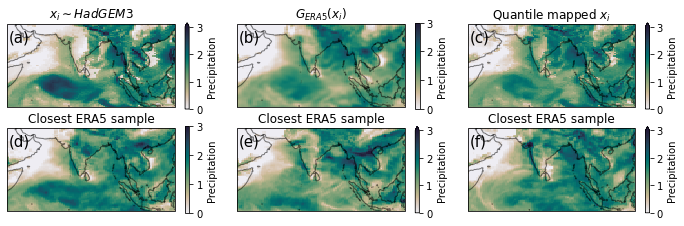

In [113]:
transform = forth_root
reverse_transform = reverse_none
vmin_override = 0 #None #-0.5
vmax_override  = 3 #40 #2
include_match_for_each=True

ds_target_pr = transform(ds_target.pr.isel(run=0))

for date in try_times_str:
    
    samples = [transform(ds.pr.isel(run=0).sel(time=date)) for ds in [ds_base, ds_trans, ds_qm]]

    
    plt.figure(figsize=(12,3.5))
    cmap=cmocean.cm.rain
    #titles = ["HadGEM3", f"UNIT translated: HadGEM3 to ERA5", f"QM translated: HadGEM3 to ERA5"]
    titles = [r'$x_i \sim HadGEM3$',
              r'$G_{ERA5}(x_i)$', 
              r'Quantile mapped $x_i$']
    


    vmin, vmax = range_multi(samples)
    if vmin_override is not None:
        vmin = vmin_override
    if vmax_override is not None:
        vmax = vmax_override

    dlon = np.diff(samples[0].lon)[0]
    lon_range = (samples[0].lon.min() - dlon/2, samples[0].lon.max() + dlon/2)

    dlat = np.diff(samples[0].lon)[0]
    lat_range = (samples[0].lat.min() - dlat/2, samples[0].lat.max() + dlat/2)

    for i, (title, letters) in enumerate(zip(titles, ['ad', 'be', 'cf'])):
        ax1 = plt.subplot(231+i, projection=projection)

        cbar_kwargs = dict(label=f"Precipitation")# if i==2 else dict(label=f"")

        reverse_transform(samples[i]).plot(ax=ax1, vmin=vmin, vmax=vmax, cmap=cmap, cbar_kwargs=cbar_kwargs)



        if i==0 or include_match_for_each:
            ax2 = plt.subplot(234+i,projection=projection)
            reverse_transform(
                find_closest(samples[i], ds_target_pr, use_ssim=0
                        )[1]
            ).plot(ax=ax2, vmin=vmin, vmax=vmax, cmap=cmap, cbar_kwargs=cbar_kwargs)

        ax1.set_title(title)
        ax1.text(45,22, f"({letters[0]})", {'fontsize':15})
        ax2.set_title('Closest ERA5 sample')
        ax2.text(45,22, f"({letters[1]})", {'fontsize':15})

        for ax in [ax1, ax2][:1+(i==0 or include_match_for_each)]:
            ax.set_xlim(*lon_range)
            ax.set_ylim(*lat_range)
            ax.coastlines(alpha=0.5)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0.1)
    plt.show()